# Business Scenario: 
	Gemstones like diamonds are always in demand because of their value in the investment market. This makes it very 
    important for diamond dealers to predict its price.

# Objective : 
	The goal of project is to build a predictive model that can accurately predict the price of diamond given its weight ,
    quality & dimension measurements.



# Dataset description

# Features  
### Price  : price in US dollars (\$326--\$18,823)
### carat  : weight of the diamond (0.2--5.01)
### cut    : quality of the cut (increasing order quality --> Fair, Good, Very Good, Premium, Ideal)
### color  : diamond color, from J (worst) to D (best)
### clarity: a measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))
### x      : length in mm (0 to 10.74)
### y      : width in mm (0 to 58.9)
### z      : depth in mm (0 to 31.8)
### Depth  : total depth in percentage Depth = length x width x height / (length x width)
### table  : width of top of diamond relative to widest point . 

## Qualitative Features (Categorical) : Cut, Color, Clarity. *

## Quantitative Features (Numerical) : Carat, Depth , Table , Price , X , Y, Z.

# Price is the target variable

##  Importing Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import math 

# Visualisation
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns 
import plotly.express as px
import plotly.graph_objects as go

In [2]:
%matplotlib inline
mpl.style.use( 'ggplot' )
plt.style.use('fivethirtyeight')
sns.set(context="notebook", palette="dark", style = 'whitegrid' , color_codes=True)
params = { 
    'axes.labelsize': "large",
    'xtick.labelsize': 'x-large',
    'legend.fontsize': 20,
    'figure.dpi': 150,
    'figure.figsize': [25, 7]
}
plt.rcParams.update(params)

In [3]:
df = pd.read_csv(r'D:/Capstone_project_2/diamonds.csv')
df.shape

(53940, 11)

In [4]:
df.head(5)

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [5]:
len(df[df.duplicated()])

0

## Drop the 'Unnamed: 0' column as we already have Index.

In [6]:
df.drop(['Unnamed: 0'] , axis=1 , inplace=True)

In [7]:
df.shape

(53940, 10)

# So, We have 53,940 rows and 10 columns

# Rename a feature x , y , z as Length, width and height of the diamond respectively

In [8]:
df.rename(columns = {"x" : "length" , "y" : "width" , "z" : "height" }, inplace = True)

In [9]:
df.head(2)

,carat,cut,color,clarity,depth,table,price,length,width,height
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31


##  Examine NaN Values

In [10]:
df.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
length     0
width      0
height     0
dtype: int64

### Great, So there are no NaN values.

In [11]:
df.describe()

,carat,depth,table,price,length,width,height
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


### 
* **The Min. Values of X, Y and Z. It can't be possible..!!**
* **It doesn't make any sense to have either of Length or Width or Height to be zero..**

In [12]:
df.loc[(df['length']==0) | (df['width']==0) | (df['height']==0)]

,carat,cut,color,clarity,depth,table,price,length,width,height
2207,1.00,Premium,G,SI2,59.1,59.0,3142,6.55,6.48,0.0
2314,1.01,Premium,H,I1,58.1,59.0,3167,6.66,6.60,0.0
4791,1.10,Premium,G,SI2,63.0,59.0,3696,6.50,6.47,0.0
5471,1.01,Premium,F,SI2,59.2,58.0,3837,6.50,6.47,0.0
10167,1.50,Good,G,I1,64.0,61.0,4731,7.15,7.04,0.0
11182,1.07,Ideal,F,SI2,61.6,56.0,4954,0.00,6.62,0.0
11963,1.00,Very Good,H,VS2,63.3,53.0,5139,0.00,0.00,0.0
13601,1.15,Ideal,G,VS2,59.2,56.0,5564,6.88,6.83,0.0
15951,1.14,Fair,G,VS1,57.5,67.0,6381,0.00,0.00,0.0
24394,2.18,Premium,H,SI2,59.4,61.0,12631,8.49,8.45,0.0


In [13]:
len(df[(df['length']==0) | (df['width']==0) | (df['height']==0)])

20

### We can see there are 20 rows with Dimensions 'Zero'.
* **We'll Drop them as it seems better choice instead of filling them with any of Mean or Median**

##  Dropping Rows with Dimensions 'Zero'.

In [14]:
df = df[(df[['length','width','height']] != 0).all(axis=1)]

In [15]:
df.loc[(df['length']==0) | (df['width']==0) | (df['height']==0)]

,carat,cut,color,clarity,depth,table,price,length,width,height


In [16]:
df.shape

(53920, 10)

##  EDA

# Correlation Between Features

<AxesSubplot:>

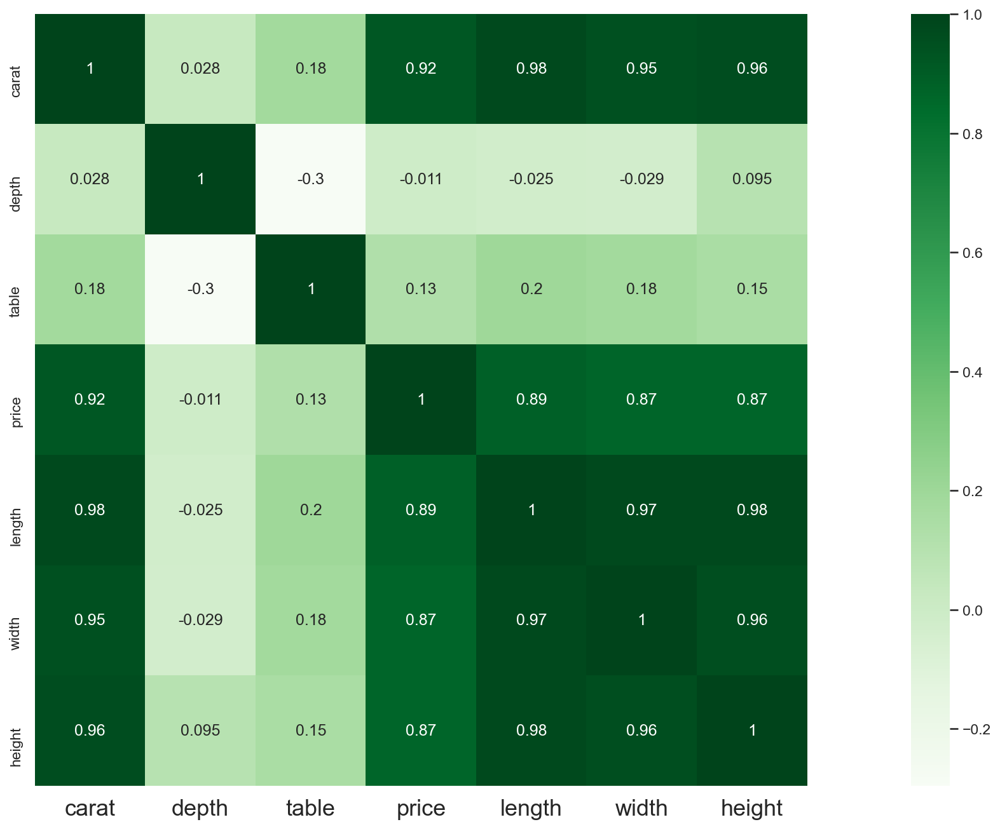

In [17]:
corr = df.corr()
plt.figure(figsize=(25,10))
sns.heatmap(data=corr, square=True , annot=True, cbar=True , cmap='Greens')

# conclusion

Depth is inversely related to Price.

The Price of the Diamond is highly correlated to Carat, and its Dimensions i.e. length , width & height 

The Carat of a diamond has the most significant impact on its Price.

The Length(x) , Width(y) and Height(z) seems to be highly related to Price and even each other.

Self Relation i.e. of a feature to itself is 1 as expected.


#  Visualization Of All Features

In [18]:
fig = go.Figure(data=[go.Pie(labels=df.cut.value_counts().index, 
                             values=df.cut.value_counts(), hole=.3)])
                            
fig.update_layout(title_text='Count of Cut of diamonds', title_x=0.5)
fig.show()

# Cut : It Describe cut quality of the diamond.
# Quality in increasing order Fair, Good, Very Good, Premium, Ideal .
# Ideal cut has the highest % i.e. 40% & premium cut has 25.6 % & then followed by very good , good & fair cut


In [19]:
fig = go.Figure(data=[go.Pie(labels=df.color.value_counts().index, 
                             values=df.color.value_counts(), hole=.3)])
                            
fig.update_layout(title_text='Count of color of diamonds', title_x=0.5)
fig.show()

# Color : Color of the Diamond.
# With D colour being the best & it's percentage in this dataset is 12.6 %  
# and J the worst which is only 5.21 %  which is low compared to other color of diamond.


In [20]:
fig = go.Figure(data=[go.Pie(labels=df.clarity.value_counts().index, 
                             values=df.clarity.value_counts(), hole=.3)])
                            
fig.update_layout(title_text='Count of clarity of diamonds', title_x=0.5)
fig.show()
# Clarity :  Diamond Clarity refers to the absence of the Inclusions and Blemishes.
# (In order from Best to Worst, FL = flawless, I3= level 3 inclusions) FL, IF, VVS1, VVS2, VS1, VS2, SI1, SI2, I1, I2, I3
# IF= only 3.32 % diamond are Internally Flawless clarity i.e they are best diamond
# I1= 1.37 % diamond are worst clarity diamond. 
# VS2  & SI1 diamond having 22.7 % & 24.2 % of clarity which is considered as medium clarity diamond & they have highest 
# % among the others. 

In [21]:
fig = px.histogram(df, x='color', color ="cut", pattern_shape="cut",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

fig.update_layout(bargap=0.2)
fig.show()

# Among all the color of diamond ideal cut diamond has the highest count followed by premium cut & then very good cut diamond
# G , H , I ,J these are Near-colorless diamonds & they have great value for the quality. 
# J the worst colur has very low count among all the cut of diamonds. 
# G has very highest count among all colur & also for every cut it has highest count .

In [22]:
fig = px.histogram(df, x='clarity', color ="cut", pattern_shape="cut",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#f0f87f",
                1: "#4696f9"})

fig.update_layout(bargap=0.2)
fig.show()
# Ideal cut diamond has the highest count among all clarity grade of diamond except SI2 clarity grade 
# In SI2 clarity grade platinum cut has highest count then ideal & followed by very good ,good , fair cut. 
# Ideal cut is highest for VS2 clarity grade & lowest for I1 clarity grade diamond 

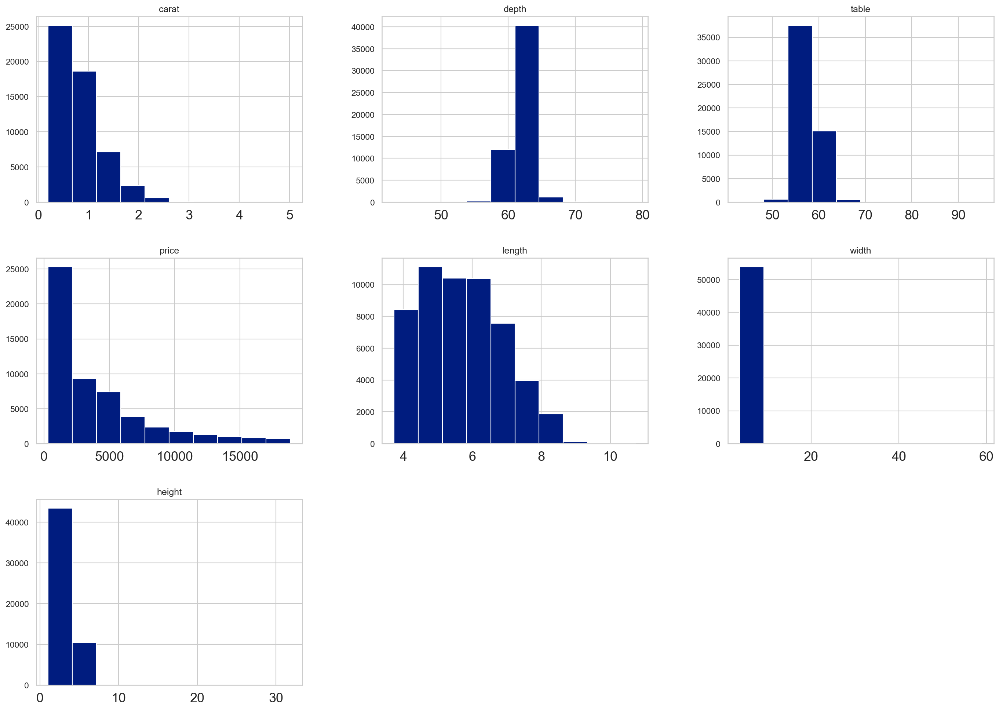

In [23]:
df.iloc[:, np.r_[0 , 4:10]].hist(figsize=(20,15));

# Observation: All variables are right skewed.

# The X . Length variable has normal distribution

# The Table , depth variable is moderately skewed

# The Price,  Carat , Y . Width , Z . Height variables are highly skewed


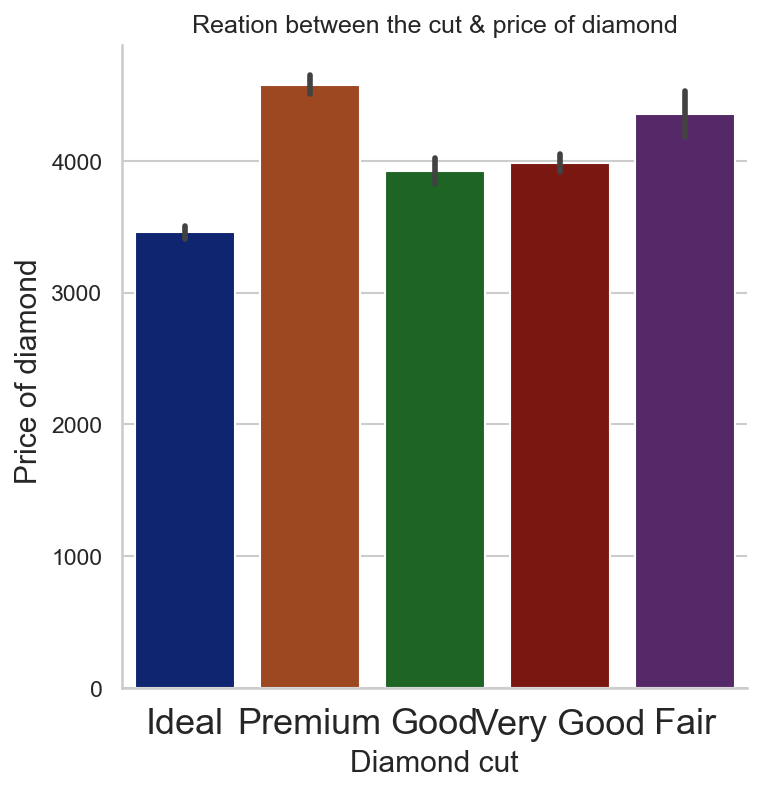

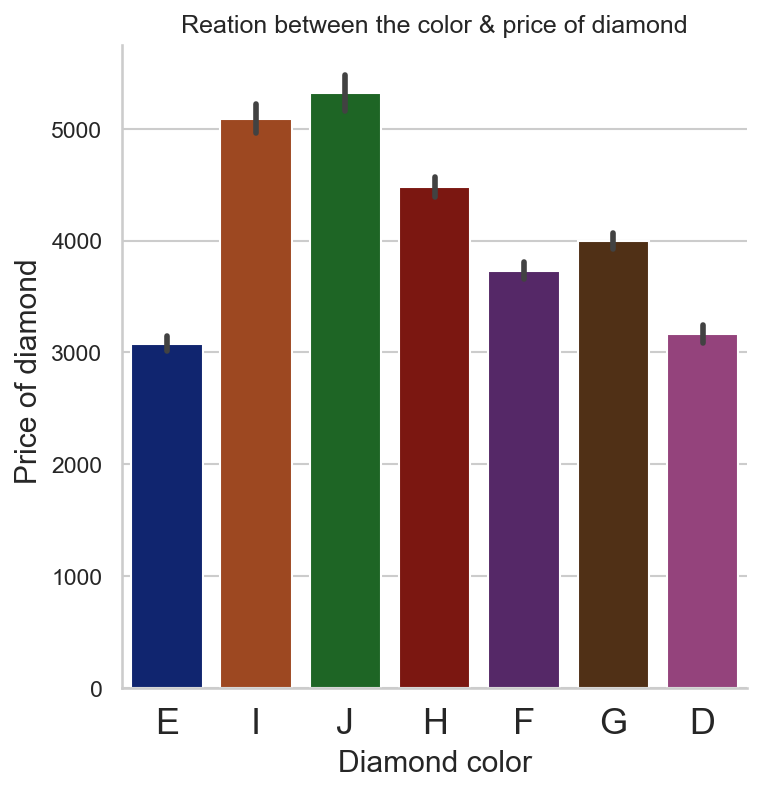

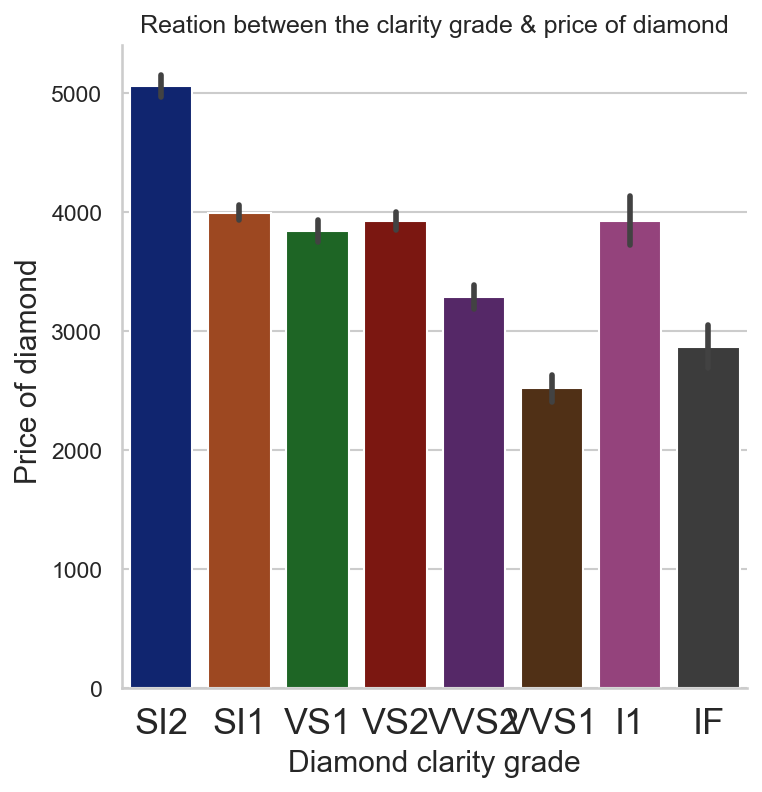

In [24]:
sns.catplot(data=df, x='cut', y='price', kind='bar' )
plt.xlabel('Diamond cut')
plt.ylabel('Price of diamond ')
plt.title('Reation between the cut & price of diamond');

sns.catplot(x='color', y='price', data=df, kind='bar')
plt.xlabel('Diamond color')
plt.ylabel('Price of diamond ')
plt.title('Reation between the color & price of diamond');

sns.catplot(x='clarity', y='price', data=df, kind='bar')
plt.xlabel('Diamond clarity grade')
plt.ylabel('Price of diamond ')
plt.title('Reation between the clarity grade & price of diamond');

(array([25333.,  9323.,  7389.,  3877.,  2364.,  1745.,  1304.,  1002.,
          861.,   722.]),
 array([  326. ,  2175.7,  4025.4,  5875.1,  7724.8,  9574.5, 11424.2,
        13273.9, 15123.6, 16973.3, 18823. ]),
 <BarContainer object of 10 artists>)

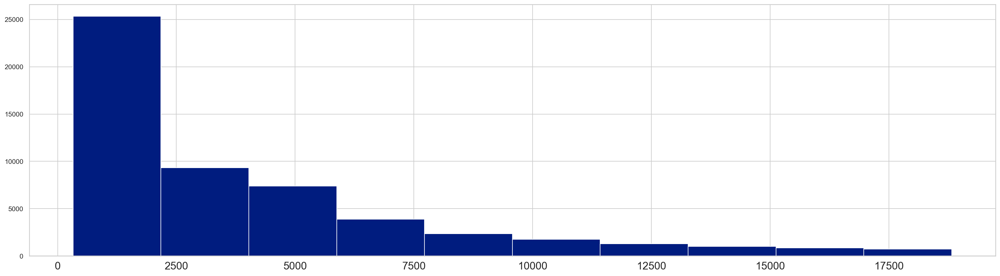

In [25]:
plt.hist(df.price)
# It is slightly positively skewed. which is acceptable.

array([[<AxesSubplot:title={'center':'carat'}>,
        <AxesSubplot:title={'center':'depth'}>],
       [<AxesSubplot:title={'center':'table'}>,
        <AxesSubplot:title={'center':'length'}>],
       [<AxesSubplot:title={'center':'width'}>,
        <AxesSubplot:title={'center':'height'}>]], dtype=object)

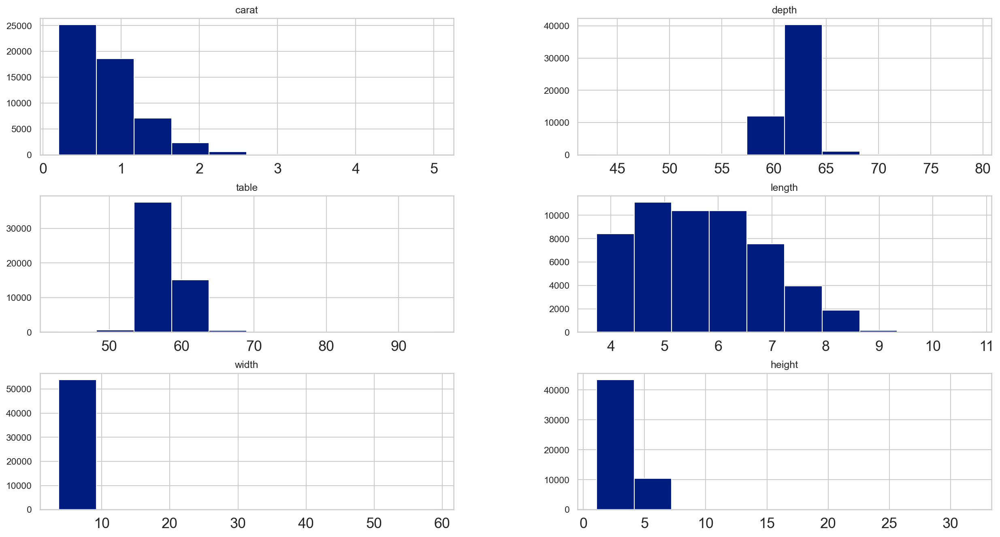

In [26]:
df.hist(['carat', 'depth', 'table', 'length','width','height'], figsize=(18,10))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

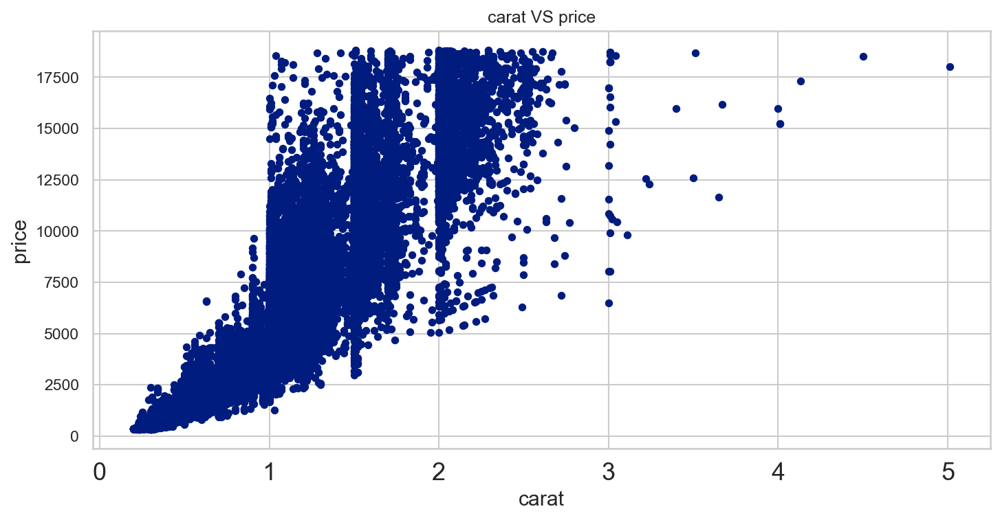

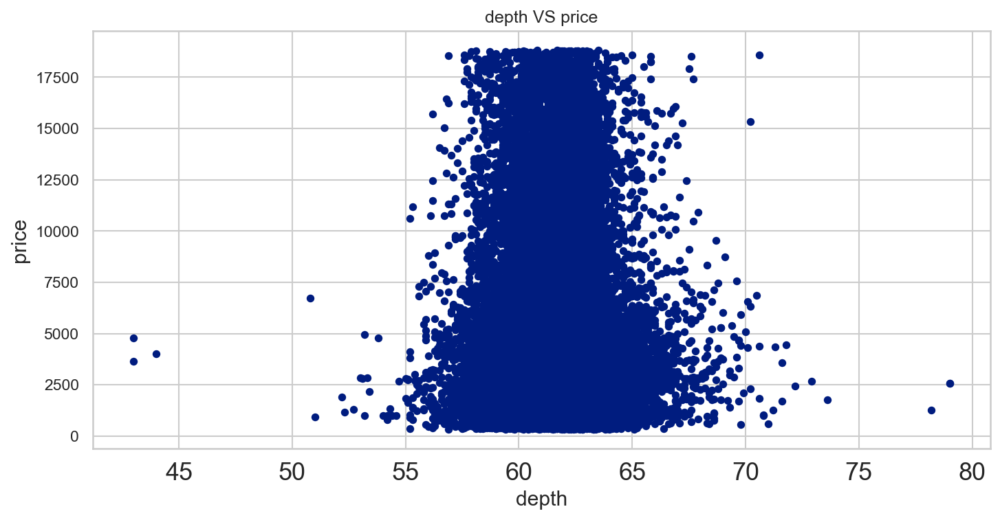

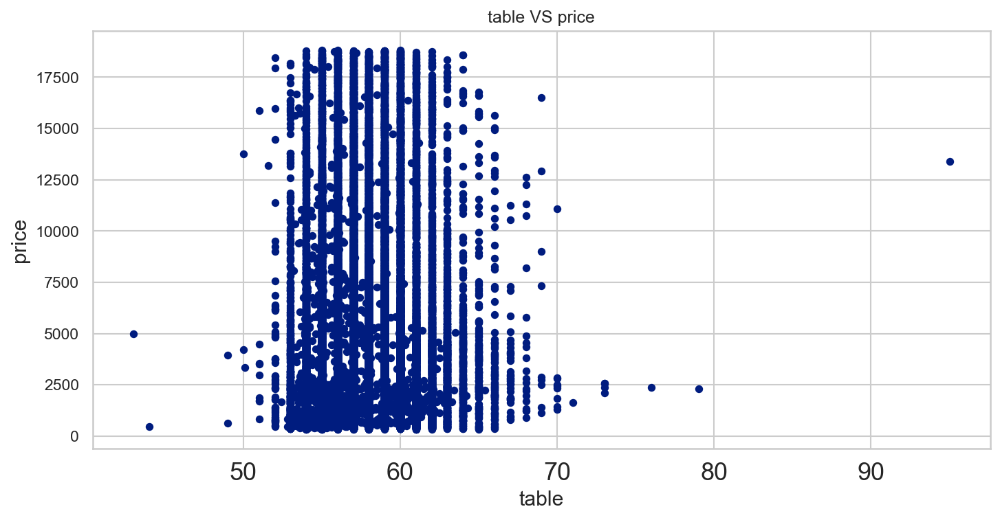

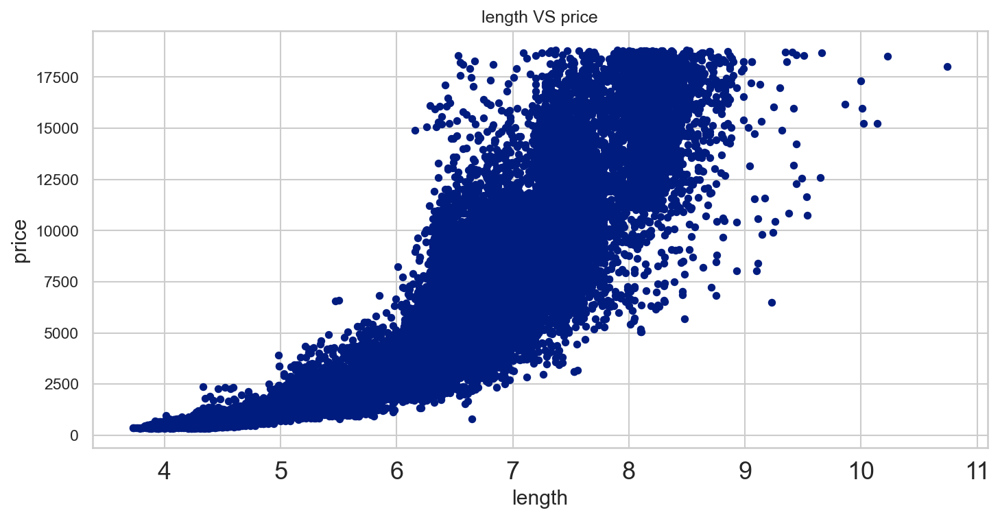

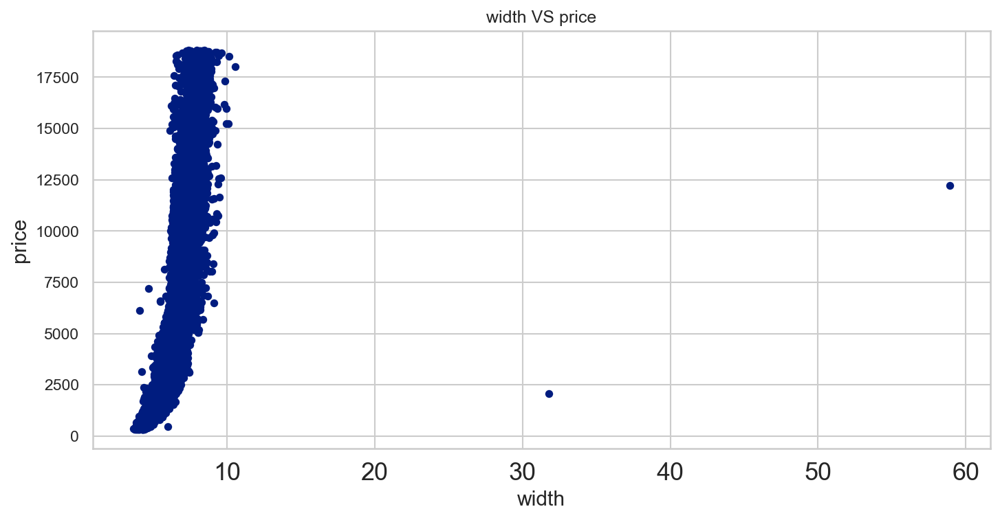

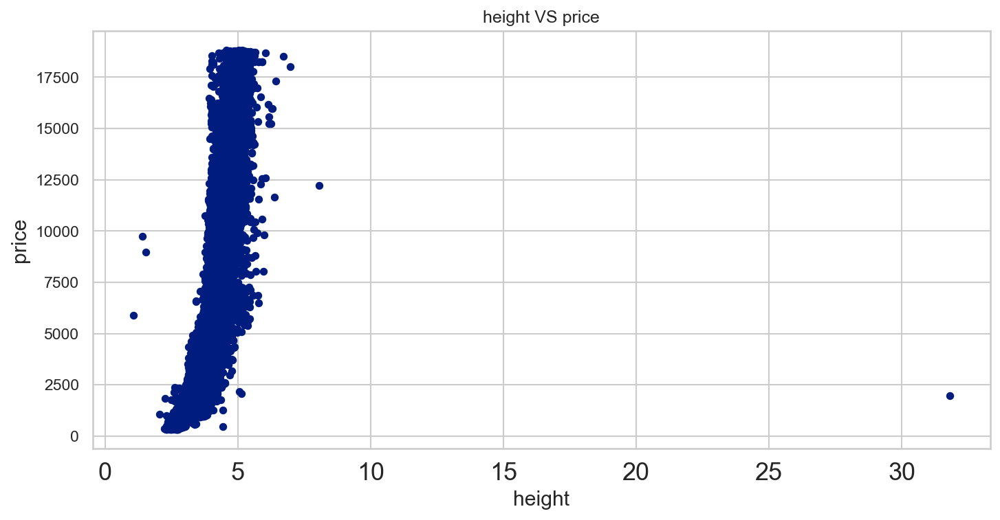

In [27]:
ContinuousCols=['carat', 'depth', 'table', 'length','width','height']

# Plotting scatter chart for each predictor vs the target variable
for predictor in ContinuousCols:
    df.plot.scatter(x=predictor, y='price', figsize=(10,5), title=predictor+" VS "+ 'price')

## Carat

* **Carat refers to the Weight of the Stone, not the Size.**
* **The Weight of a Diamond has the most significant Impact on its Price.**




# Visualize via kde plots

<AxesSubplot:xlabel='carat', ylabel='Density'>

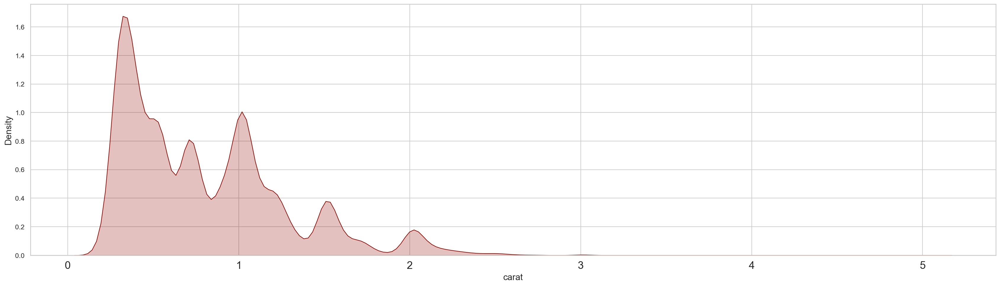

In [28]:
sns.kdeplot(df['carat'], shade=True , color='r')

### Carat vs Price

<AxesSubplot:xlabel='carat', ylabel='price'>

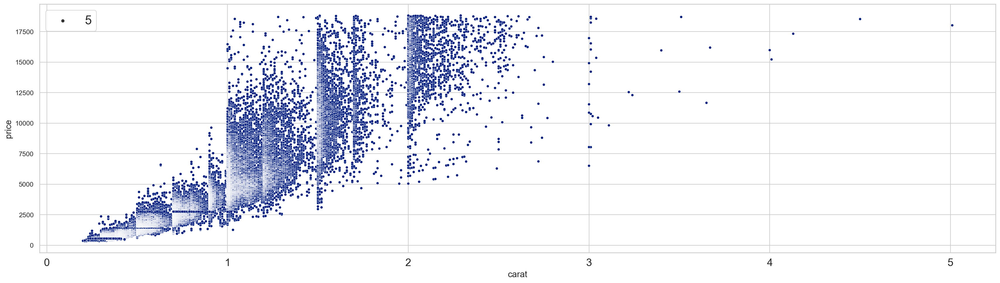

In [29]:
sns.scatterplot(x='carat' , y='price' , data=df , size=5)

### It seems that Carat varies with Price Exponentially.

##  Cut

* **Although the Carat Weight of a Diamond has the Strongest Effect on Prices, the Cut can still Drastically Increase or Decrease its value.**
* **With a Higher Cut Quality, the Diamond’s Cost per Carat Increases.**


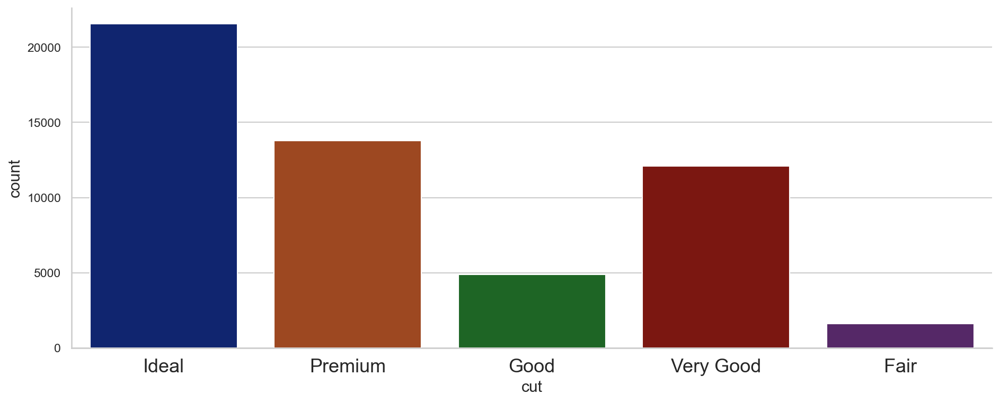

In [30]:
sns.factorplot(x='cut', data=df , kind='count',aspect=2.5 )

## Cut vs Price

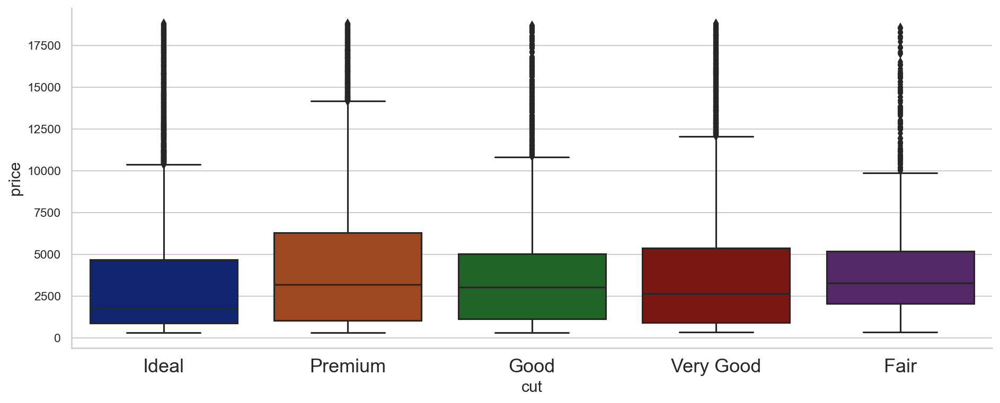

In [31]:
sns.factorplot(x='cut', y='price', data=df, kind='box' ,aspect=2.5 )

### Premium Cut on Diamonds as we can see are the most Expensive, followed by Very Good Cut.

##  Color
* **The Color of a Diamond refers to the Tone and Saturation of Color, or the Depth of Color in a Diamond.**
* **The Color of a Diamond can Range from Colorless to a Yellow or a Faint Brownish Colored hue.**
* **Colorless Diamonds are Rarer and more Valuable because they appear Whiter and Brighter.**

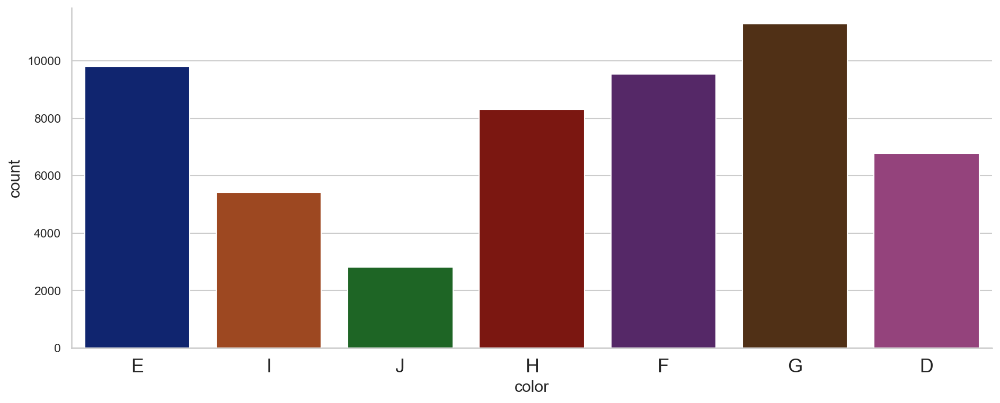

In [32]:
sns.factorplot(x='color', data=df , kind='count',aspect=2.5 )

## Depth
* **The Depth of a Diamond is its Height (in millimeters) measured from the Culet to the Table.**
* **If a Diamond's Depth Percentage is too large or small the Diamond will become Dark in appearance **  *

(array([3.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        2.0000e+00, 4.0000e+00, 1.1000e+01, 4.3000e+01, 2.1900e+02,
        1.4240e+03, 5.0730e+03, 1.8242e+04, 2.2649e+04, 5.0330e+03,
        8.5100e+02, 2.3400e+02, 8.7000e+01, 2.7000e+01, 1.1000e+01,
        3.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 3.0000e+00]),
 array([43.  , 44.44, 45.88, 47.32, 48.76, 50.2 , 51.64, 53.08, 54.52,
        55.96, 57.4 , 58.84, 60.28, 61.72, 63.16, 64.6 , 66.04, 67.48,
        68.92, 70.36, 71.8 , 73.24, 74.68, 76.12, 77.56, 79.  ]),
 <BarContainer object of 25 artists>)

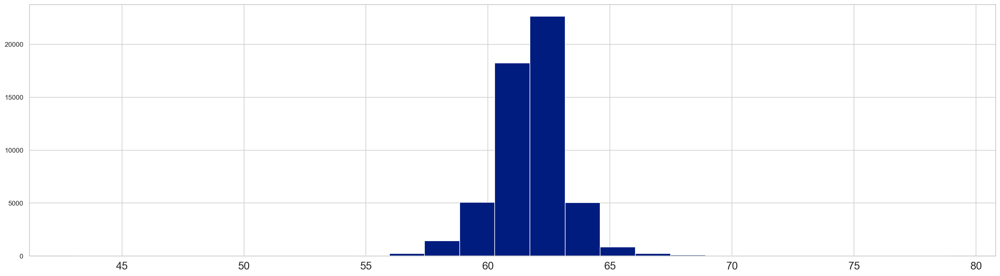

In [33]:
plt.hist('depth' , data=df , bins=25)

<AxesSubplot:xlabel='depth', ylabel='price'>

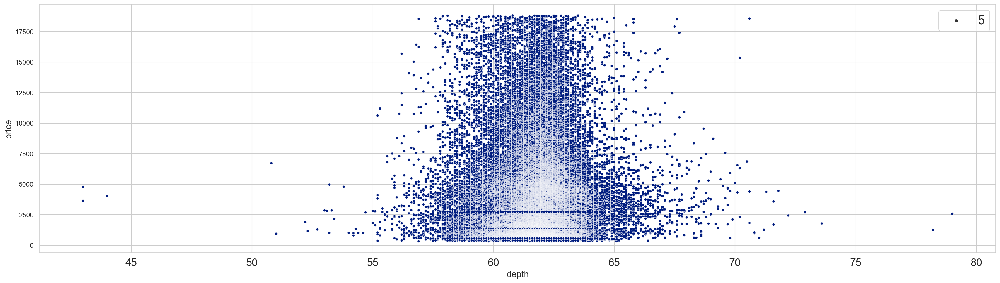

In [34]:
sns.scatterplot(x='depth' , y='price' , data=df , size=5)

### We can Infer from the plot that the Price can vary heavily for the same Depth.
* **And the Correlation shows that there's a slightly inverse relation between the two.**

##  Table
* **Table is the Width of the Diamond's Table expressed as a Percentage of its Average Diameter.**

<AxesSubplot:xlabel='table', ylabel='Density'>

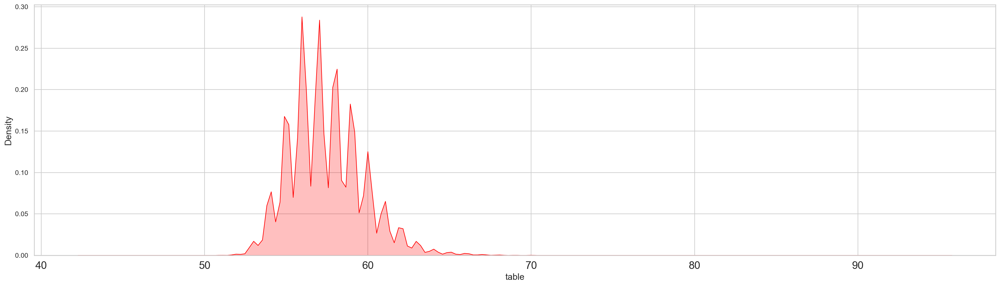

In [35]:
sns.kdeplot(df['table'] ,shade=True , color='red')

<AxesSubplot:xlabel='table', ylabel='price'>

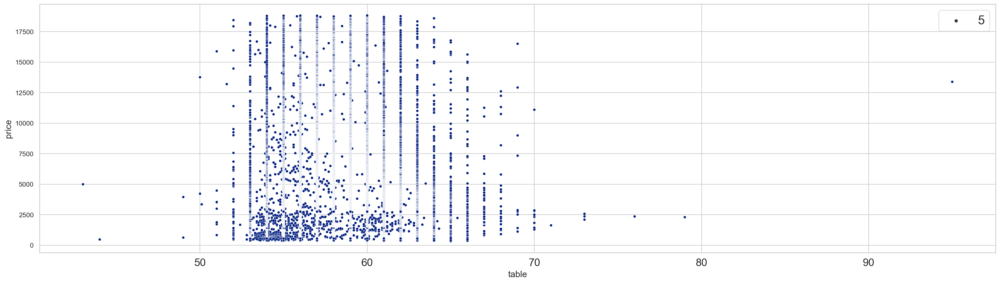

In [36]:
sns.scatterplot(x='table', y='price', data=df , size=5)

##  Dimensions

* **As the Dimensions increases, Obviously the Prices Rises as more .**

(2.0, 10.0)

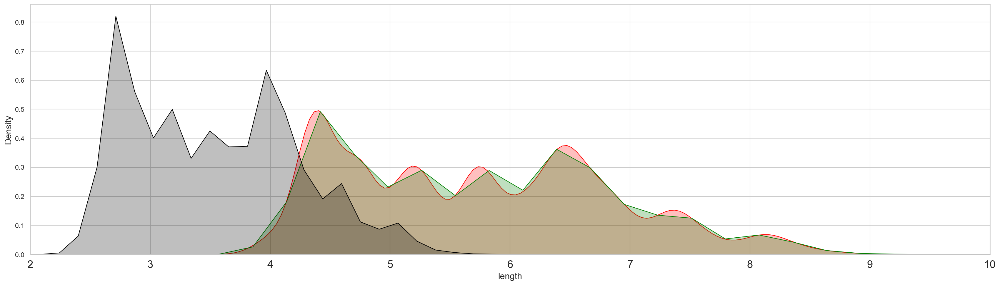

In [37]:
sns.kdeplot(df['length'] ,shade=True , color='red' )
sns.kdeplot(df['width'] , shade=True , color='green' )
sns.kdeplot(df['height'] , shade= True , color='black')
plt.xlim(2,10)

In [38]:
df.head(5)

,carat,cut,color,clarity,depth,table,price,length,width,height
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


# Outlier treatment

In [40]:
df_numeric = df._get_numeric_data()
df_numeric.head(5)

,carat,depth,table,price,length,width,height
0,0.23,61.5,55.0,326,3.95,3.98,2.43
1,0.21,59.8,61.0,326,3.89,3.84,2.31
2,0.23,56.9,65.0,327,4.05,4.07,2.31
3,0.29,62.4,58.0,334,4.20,4.23,2.63
4,0.31,63.3,58.0,335,4.34,4.35,2.75


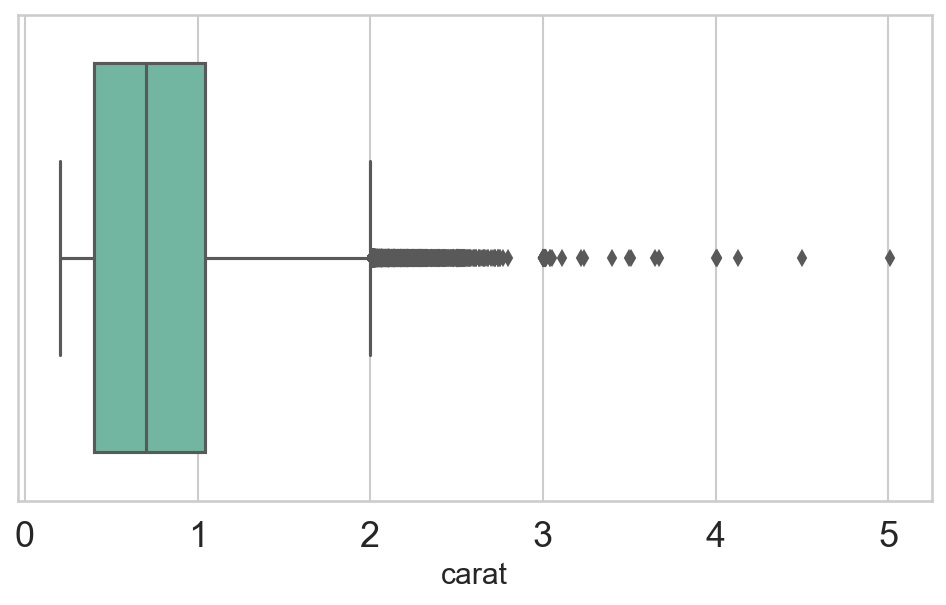

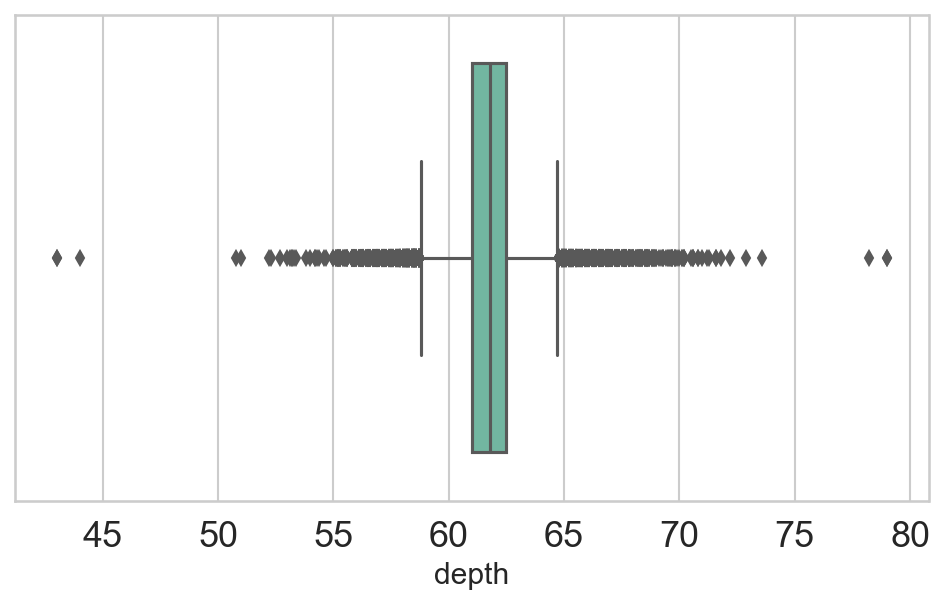

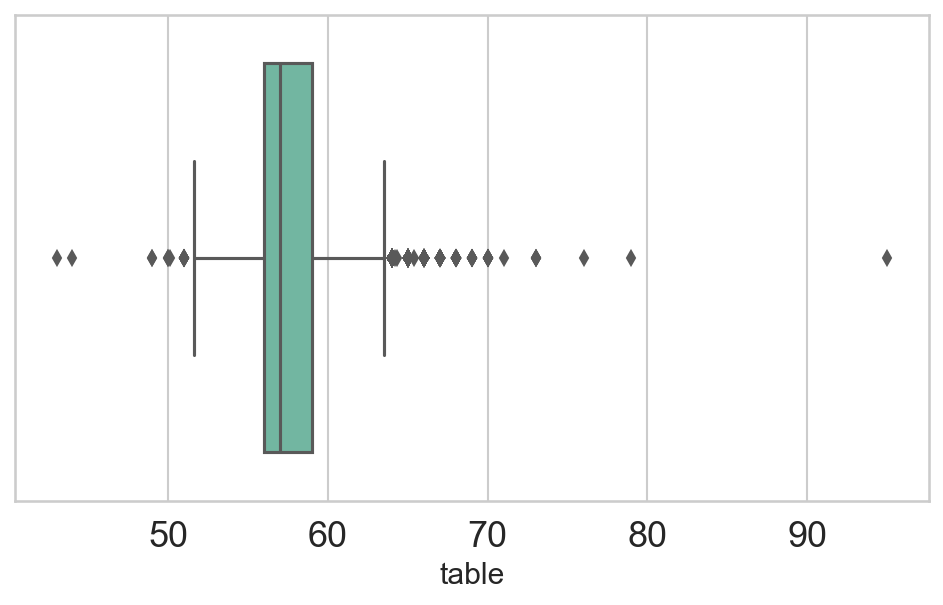

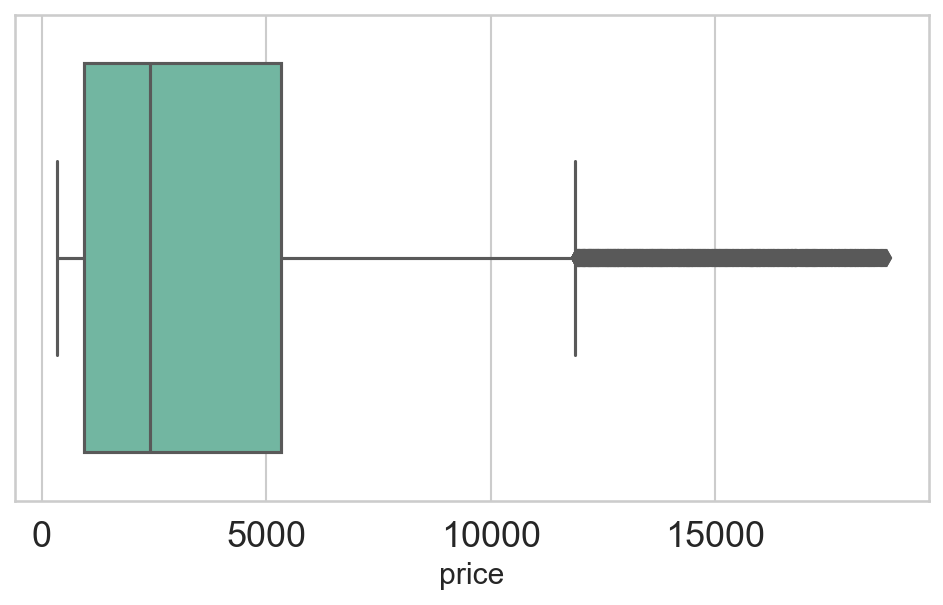

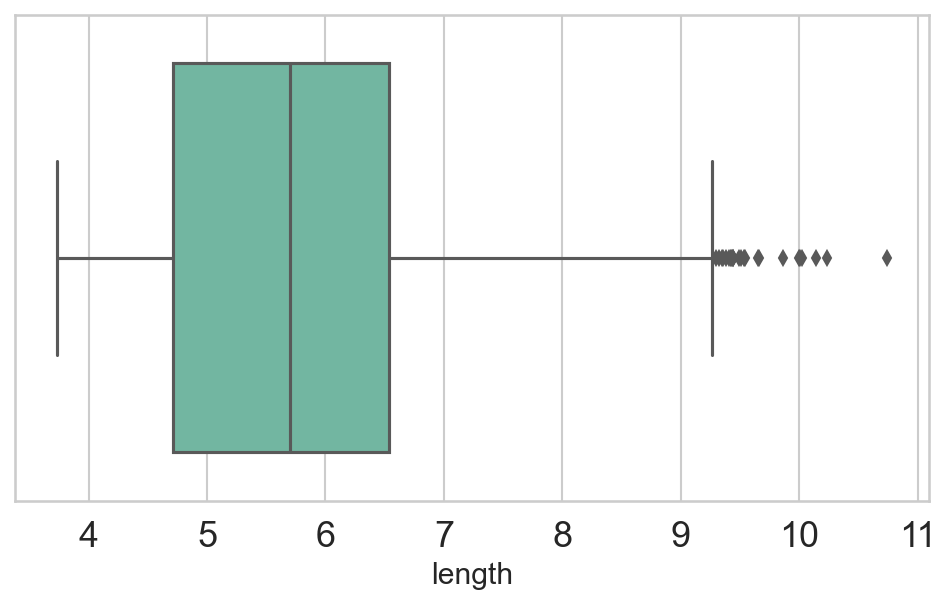

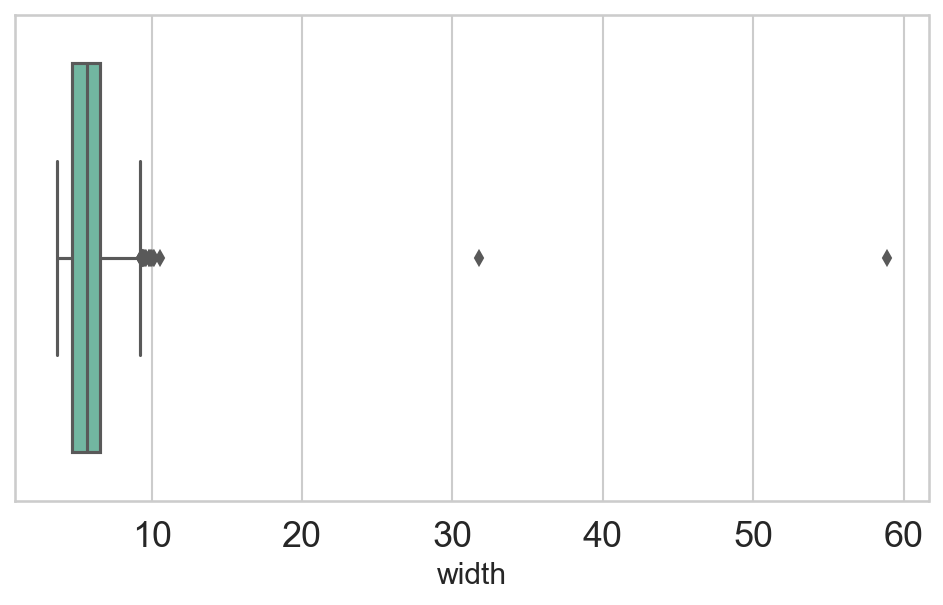

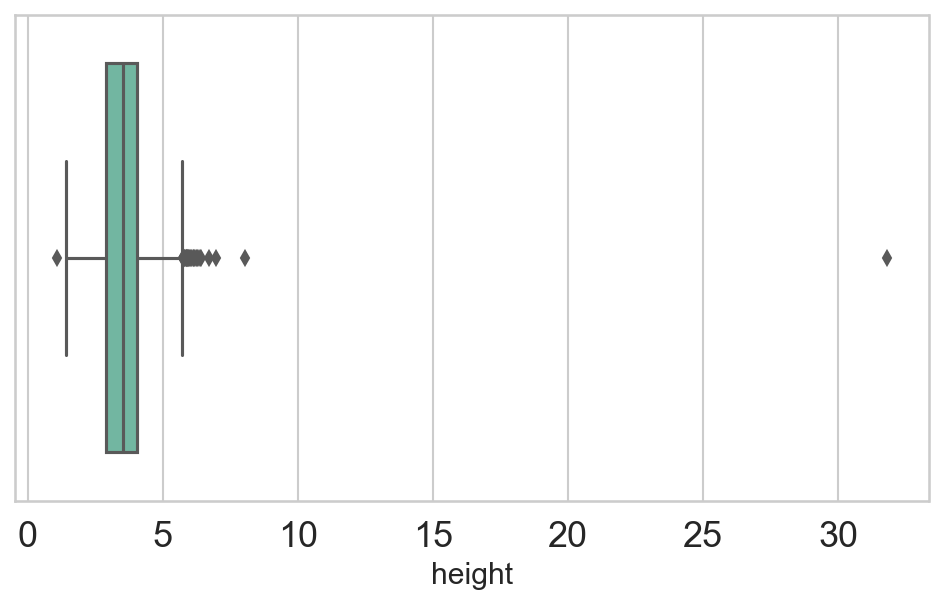

In [41]:
for i in df_numeric:
    plt.figure(figsize=(7,4))
    sns.boxplot(x=df_numeric[i],palette="Set2");
    plt.show()

In [42]:
df_outliers = df_numeric.iloc[: , np.r_[0,1,2,4,5,6]]
df_outliers.head()

,carat,depth,table,length,width,height
0,0.23,61.5,55.0,3.95,3.98,2.43
1,0.21,59.8,61.0,3.89,3.84,2.31
2,0.23,56.9,65.0,4.05,4.07,2.31
3,0.29,62.4,58.0,4.20,4.23,2.63
4,0.31,63.3,58.0,4.34,4.35,2.75


In [43]:
column     =[]

Q1_value   =[]
Q3_value   =[]
IQR_value  =[]

lower_whisker_value =[]
upper_whisker_value =[]


for i in df_outliers:
    
    Q1 = df_outliers[i].quantile(0.25)
    Q3 = df_outliers[i].quantile(0.75)
    IQR = Q3 - Q1
    whisker_width = 1.5
    lower_whisker = Q1 - (whisker_width*IQR)
    upper_whisker = Q3 + (whisker_width*IQR)
    df_outliers[i]=np.where(df_outliers[i]>upper_whisker,upper_whisker,
                            np.where(df_outliers[i]<lower_whisker,lower_whisker,df_outliers[i]))
    
    column.append(i)
    Q1_value.append(Q1)
    Q3_value.append(Q3)
    IQR_value.append(IQR)
    lower_whisker_value.append(lower_whisker)
    upper_whisker_value.append(upper_whisker)
    
outliers_summary = pd.DataFrame({"Numeric_column":column , 
                      "25_percentile_value":Q1_value, 
                      "75_percentile_value": Q3_value ,
                      "IQR_range": IQR_value , 
                      "lower_whisker_value":lower_whisker_value ,
                     "upper_whisker_value" : upper_whisker_value } )
outliers_summary

,Numeric_column,25_percentile_value,75_percentile_value,IQR_range,lower_whisker_value,upper_whisker_value
0,carat,0.40,1.04,0.64,-0.560,2.000
1,depth,61.00,62.50,1.50,58.750,64.750
2,table,56.00,59.00,3.00,51.500,63.500
3,length,4.71,6.54,1.83,1.965,9.285
4,width,4.72,6.54,1.82,1.990,9.270
5,height,2.91,4.04,1.13,1.215,5.735


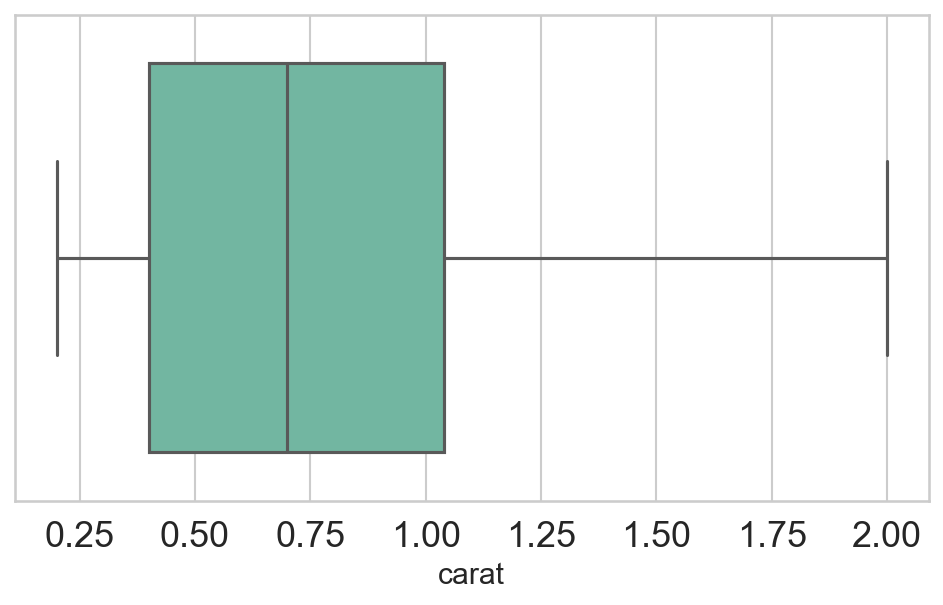

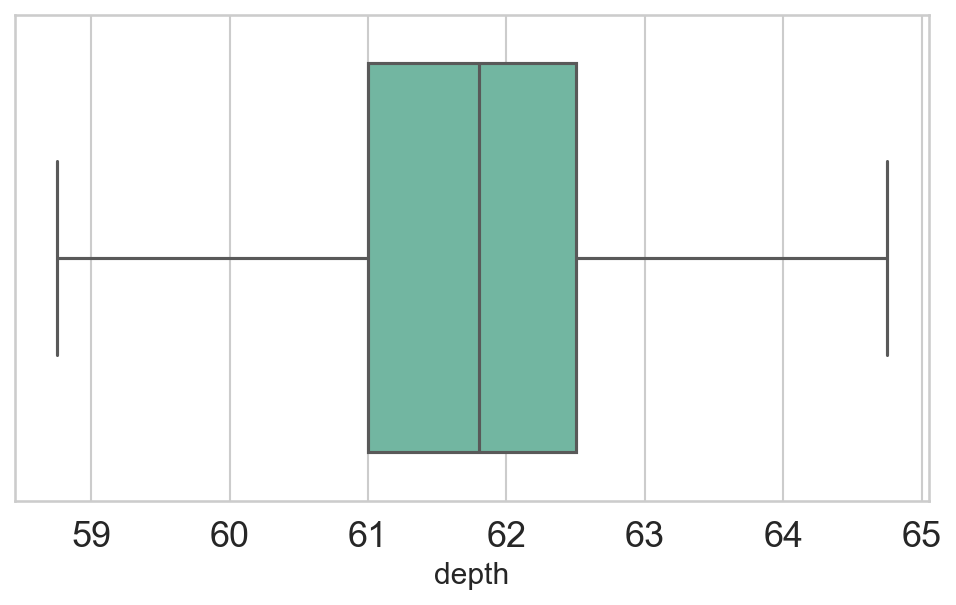

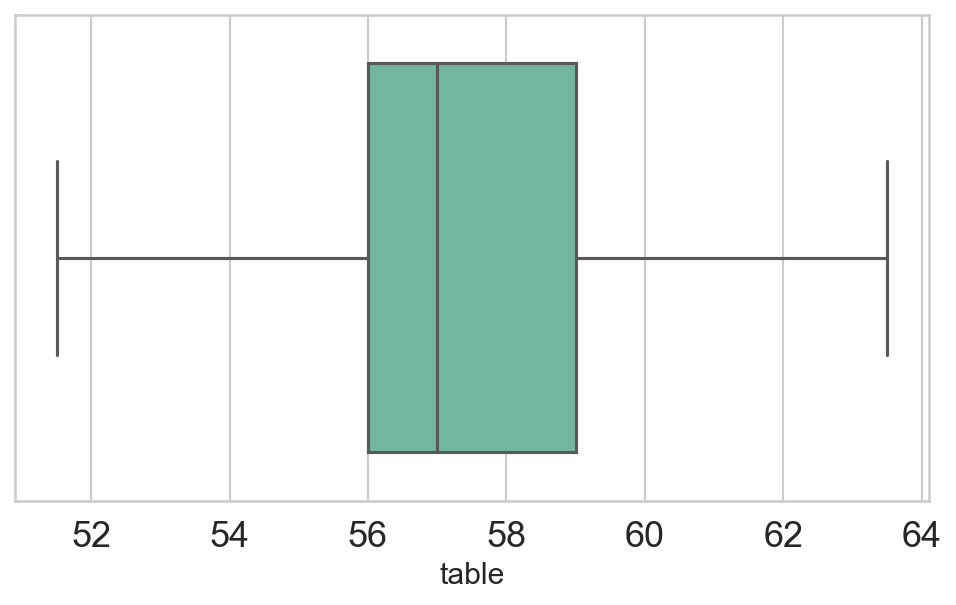

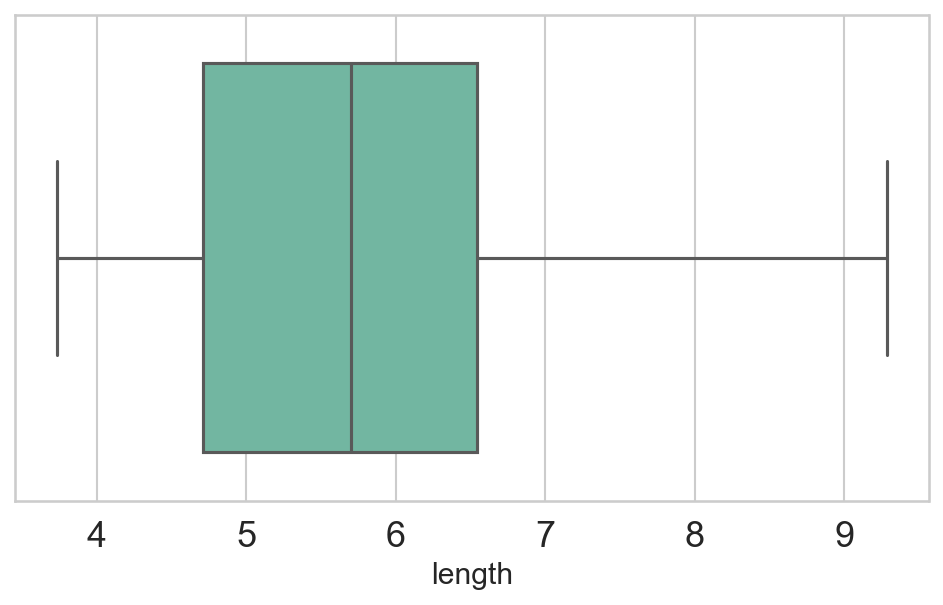

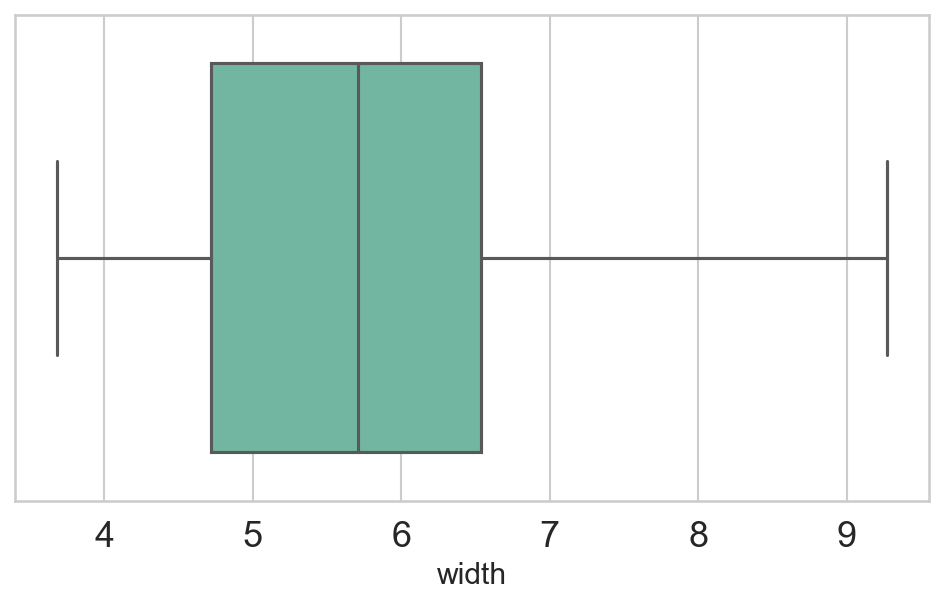

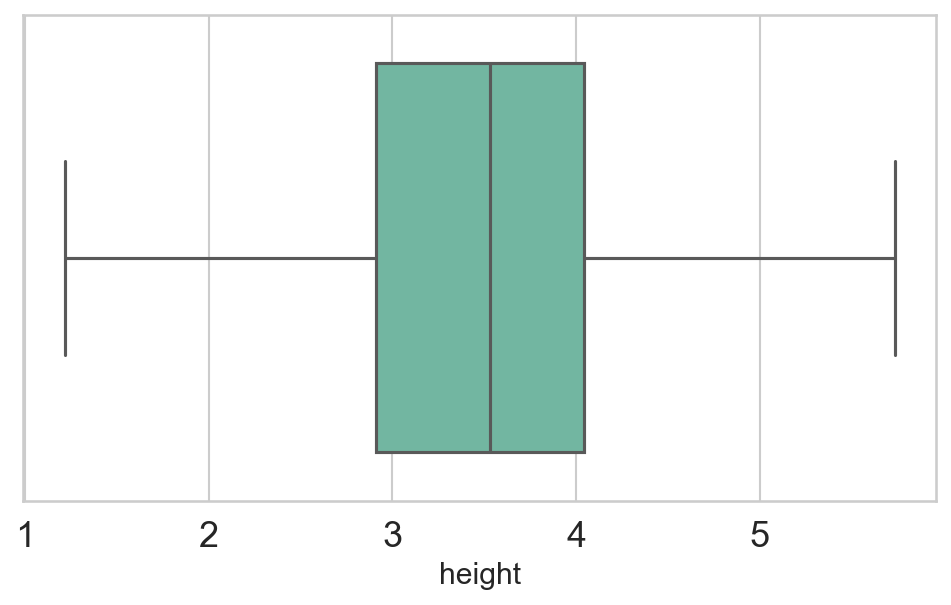

In [44]:
for i in df_outliers:
    plt.figure(figsize=(7,4))
    sns.boxplot(x=df_outliers[i],palette="Set2");
    plt.show()

In [45]:
df = df.drop(["carat" , "depth" ,"table" ,'length' ,'width' ,'height' ] ,axis=1)
df.head()

,cut,color,clarity,price
0,Ideal,E,SI2,326
1,Premium,E,SI1,326
2,Good,E,VS1,327
3,Premium,I,VS2,334
4,Good,J,SI2,335


In [46]:
df = pd.concat([df , df_outliers] , axis=1)
df.head(5)

,cut,color,clarity,price,carat,depth,table,length,width,height
0,Ideal,E,SI2,326,0.23,61.50,55.0,3.95,3.98,2.43
1,Premium,E,SI1,326,0.21,59.80,61.0,3.89,3.84,2.31
2,Good,E,VS1,327,0.23,58.75,63.5,4.05,4.07,2.31
3,Premium,I,VS2,334,0.29,62.40,58.0,4.20,4.23,2.63
4,Good,J,SI2,335,0.31,63.30,58.0,4.34,4.35,2.75


#  Feature Encoding

In [51]:
cat_features = [column for column in df.columns if df[column].dtype == "object"]
print("Categorical features = " , cat_features)
print("\nTotal count of Categorical features = " , len(cat_features))

Categorical features =  ['cut', 'color', 'clarity']

Total count of Categorical features =  3


In [52]:
num_features = [column for column in df.columns if df[column].dtype in ["int64", "float64"]]
print("Numeric features = " , num_features)
print("\nTotal count of Numeric features = " , len(num_features))

Numeric features =  ['price', 'carat', 'depth', 'table', 'length', 'width', 'height']

Total count of Numeric features =  7


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53920 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   cut      53920 non-null  object 
 1   color    53920 non-null  object 
 2   clarity  53920 non-null  object 
 3   price    53920 non-null  int64  
 4   carat    53920 non-null  float64
 5   depth    53920 non-null  float64
 6   table    53920 non-null  float64
 7   length   53920 non-null  float64
 8   width    53920 non-null  float64
 9   height   53920 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 6.5+ MB


In [54]:
df.cut.value_counts()

Ideal        21548
Premium      13780
Very Good    12081
Good          4902
Fair          1609
Name: cut, dtype: int64

In [55]:
df.color.value_counts()

G    11284
E     9797
F     9538
H     8298
D     6774
I     5421
J     2808
Name: color, dtype: int64

In [56]:
df.clarity.value_counts()

SI1     13063
VS2     12254
SI2      9185
VS1      8170
VVS2     5066
VVS1     3654
IF       1790
I1        738
Name: clarity, dtype: int64

Fair < Good < Very Good < Premium < Ideal

J < I < H < G < F < E < D

I1 < SI2 < SI1 < VS2 < VS1 < VVS2 < VVS1 < IF

In [57]:
df.cut = df.cut.replace({'Fair': 0,'Good': 1, 'Very Good': 2,'Premium': 3,'Ideal': 4})

In [58]:
df.color=df.color.replace({'J': 0, 'I': 1, 'H': 2, 'G': 3,'F': 4, 'E': 5,'D': 6 })

In [59]:
df.clarity = df.clarity.replace({'I1': 0, 'SI2': 1, 'SI1': 2, 'VS2': 3, 
                                 'VS1': 4, 'VVS2': 5, 'VVS1': 6, 'IF': 7}) 

In [60]:
df.head(5)

,cut,color,clarity,price,carat,depth,table,length,width,height
0,4,5,1,326,0.23,61.50,55.0,3.95,3.98,2.43
1,3,5,2,326,0.21,59.80,61.0,3.89,3.84,2.31
2,1,5,4,327,0.23,58.75,63.5,4.05,4.07,2.31
3,3,1,3,334,0.29,62.40,58.0,4.20,4.23,2.63
4,1,0,1,335,0.31,63.30,58.0,4.34,4.35,2.75


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53920 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   cut      53920 non-null  int64  
 1   color    53920 non-null  int64  
 2   clarity  53920 non-null  int64  
 3   price    53920 non-null  int64  
 4   carat    53920 non-null  float64
 5   depth    53920 non-null  float64
 6   table    53920 non-null  float64
 7   length   53920 non-null  float64
 8   width    53920 non-null  float64
 9   height   53920 non-null  float64
dtypes: float64(6), int64(4)
memory usage: 6.5 MB



# Feature Selection

<a id="feat_imp_extra"></a>
## Feature_importance using ExtraTreesRegressor

In [63]:
X = df.drop(['price'], axis=1)
Y = df['price']

In [65]:
from sklearn.ensemble import ExtraTreesRegressor
model_extra = ExtraTreesRegressor()
model_extra.fit(X, Y)

ExtraTreesRegressor()

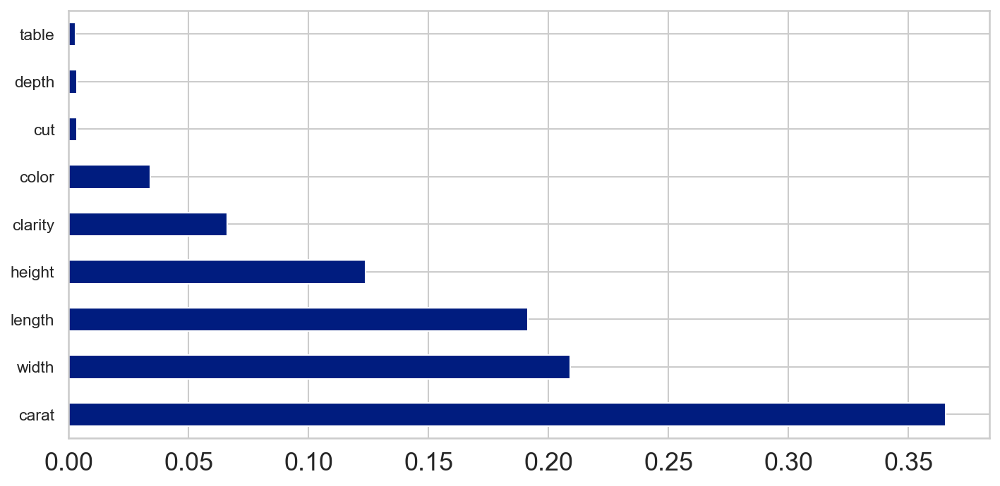

In [66]:
plt.figure(figsize=(10,5))
feat_imp = pd.Series(model_extra.feature_importances_ , index=X.columns)
feat_imp.nlargest(20).plot(kind='barh');

# RFE

In [67]:
from sklearn.linear_model import LinearRegression
estimator = LinearRegression()
from sklearn.feature_selection import RFE
selector = RFE(estimator, step=1, n_features_to_select= 7)
selector = selector.fit(X, Y)

In [68]:
selector.support_

array([ True,  True,  True,  True, False, False,  True,  True,  True])

In [70]:
feature_imp = pd.DataFrame({"Importance" : selector.support_ , "Columns" : X.columns})
feature_imp.sort_values('Importance' , ascending= False)


,Importance,Columns
0,True,cut
1,True,color
2,True,clarity
3,True,carat
6,True,length
7,True,width
8,True,height
4,False,depth
5,False,table


# mutual_info_regression

In [71]:
from sklearn.feature_selection import mutual_info_regression
importance = mutual_info_regression(X , Y )

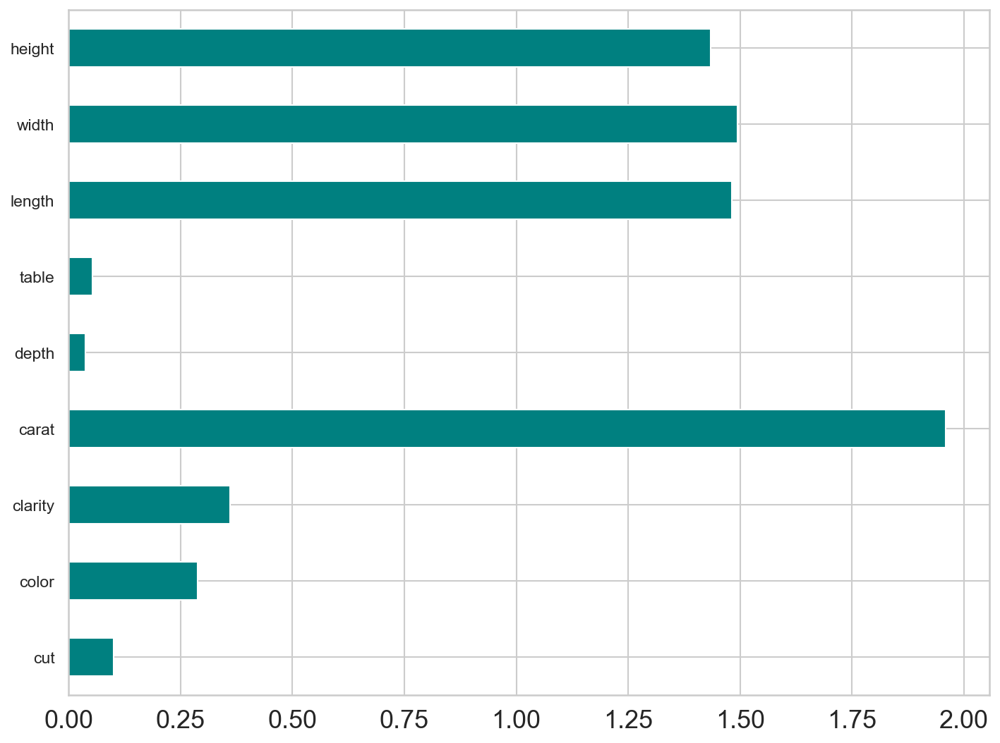

In [73]:
feat_imp = pd.Series(importance, X.columns[0:len(X.columns)+1]) 
plt.figure(figsize=(10,8))
feat_imp.plot(kind='barh' , color='teal')
plt.show()

# Chi-sq test

In [39]:

from sklearn.feature_selection import chi2  
from scipy.stats import chi2_contingency

cal_val , P_value, DoF , Expected = chi2_contingency(pd.crosstab(df['depth'],df['price']))

if P_value > 0.05:
    print(P_value)
    print("---------")
    print("We fail to reject the nulls ----> NULL is still VALID ")
    print("There is NO relationship between two variables")
else:
    print(P_value)
    print("--------")
    print("NULL is REJECTED")
    print("There is relationship between two variables")

1.0
---------
We fail to reject the nulls ----> NULL is still VALID 
There is NO relationship between two variables


In [77]:
cal_val , P_value, DoF , Expected = chi2_contingency(pd.crosstab(df['table'],df['price']))

if P_value > 0.05:
    print(P_value)
    print("---------")
    print("We fail to reject the nulls ----> NULL is still VALID ")
    print("There is NO relationship between two variables")
else:
    print(P_value)
    print("--------")
    print("NULL is REJECTED")
    print("There is relationship between two variables")

0.3606340902387553
---------
We fail to reject the nulls ----> NULL is still VALID 
There is NO relationship between two variables


# Dropping the Non-significant variable

In [84]:
df.head(5)

,cut,color,clarity,price,carat,depth,table,length,width,height
0,4,5,1,326,0.23,61.50,55.0,3.95,3.98,2.43
1,3,5,2,326,0.21,59.80,61.0,3.89,3.84,2.31
2,1,5,4,327,0.23,58.75,63.5,4.05,4.07,2.31
3,3,1,3,334,0.29,62.40,58.0,4.20,4.23,2.63
4,1,0,1,335,0.31,63.30,58.0,4.34,4.35,2.75


In [85]:
X = X.drop(['table' ,'depth'] , axis =1)
X.head(5)

,cut,color,clarity,carat,length,width,height
0,4,5,1,0.23,3.95,3.98,2.43
1,3,5,2,0.21,3.89,3.84,2.31
2,1,5,4,0.23,4.05,4.07,2.31
3,3,1,3,0.29,4.20,4.23,2.63
4,1,0,1,0.31,4.34,4.35,2.75


In [87]:
Y

0         326
1         326
2         327
3         334
4         335
         ... 
53935    2757
53936    2757
53937    2757
53938    2757
53939    2757
Name: price, Length: 53920, dtype: int64

* **Divide the Dataset into Train and Test, So that we can fit the Train for Modelling Algos and Predict on Test.**

In [86]:
X.head()

,cut,color,clarity,carat,length,width,height
0,4,5,1,0.23,3.95,3.98,2.43
1,3,5,2,0.21,3.89,3.84,2.31
2,1,5,4,0.23,4.05,4.07,2.31
3,3,1,3,0.29,4.20,4.23,2.63
4,1,0,1,0.31,4.34,4.35,2.75


In [88]:
from sklearn.model_selection import train_test_split

In [89]:
x_train, x_test, y_train, y_test = train_test_split(X , Y , test_size=0.2 , random_state=20)

In [90]:
x_train

,cut,color,clarity,carat,length,width,height
19629,2,3,6,1.00,6.34,6.44,3.98
43756,4,4,7,0.41,4.77,4.79,2.96
2109,3,2,0,1.08,6.54,6.59,4.05
44466,4,4,2,0.51,5.22,5.16,3.17
12025,3,5,1,1.11,6.71,6.65,4.18
...,...,...,...,...,...,...,...
23461,3,2,2,1.62,7.50,7.46,4.65
23784,2,6,1,1.71,7.58,7.51,4.79
37152,4,6,3,0.32,4.39,4.36,2.72
27111,3,2,2,2.00,8.06,7.99,4.98


In [91]:
x_test

,cut,color,clarity,carat,length,width,height
51907,1,5,1,0.70,5.63,5.58,3.57
38439,2,4,7,0.35,4.55,4.58,2.83
17594,1,5,6,1.00,6.29,6.26,4.02
30176,4,3,7,0.29,4.26,4.29,2.62
44681,3,6,2,0.50,5.08,5.07,3.16
...,...,...,...,...,...,...,...
33689,4,5,5,0.34,4.48,4.52,2.78
24506,3,5,5,1.20,6.83,6.79,4.24
15118,4,1,3,1.24,6.90,6.87,4.27
19076,4,4,5,1.00,6.46,6.41,3.96


In [92]:
y_test

51907     2435
38439     1027
17594     7084
30176      721
44681     1610
         ...  
33689      838
24506    12787
15118     6076
19076     7849
22894    10934
Name: price, Length: 10784, dtype: int64

In [72]:
y_train

19629     8246
43756     1439
2109      3118
44466     1593
12025     5152
         ...  
23461    11455
23784    11844
37152      972
27111    17265
48500     1981
Name: price, Length: 43136, dtype: int64

# Applying Feature Scaling ( StandardScaler )


In [93]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [94]:
x_train = pd.DataFrame(sc.fit_transform(x_train))
x_test = pd.DataFrame(sc.transform(x_test))

# Modelling Algos

In [95]:
# Collect all R2 Scores , MSE , MAE , RMSE 

R2_Scores = []
Adj_R2    = []
RMSE = []
MSE = []  
MAE = []


models = ['Linear Regression' , 
          'Lasso Regression' ,
          'Tune Lasso Regression' , 
          'Ridge Regression' , 
          'Tune Ridge Regression' , 
          'AdaBoost Regression'  , 
          'GradientBoosting Regression',
          'Decision Tree' ,
          'RandomForest Regression' ,
          'Tune Random Forest' ,  
          'KNeighbours Regression' ,
          'Tune KNeighbours Regression']  

## 1) Linear Regression

In [96]:
from sklearn.linear_model import LinearRegression 
lr = LinearRegression()

In [97]:
lr.fit(x_train , y_train)

LinearRegression()

In [98]:
lr.intercept_

3911.0487064169147

In [99]:
lr.coef_

array([  178.55255968,   546.62647209,   783.35511108,  6350.23387302,
       -2784.5005315 ,  1748.03505624, -1227.86025777])

In [100]:
Rsq_train = lr.score(x_train , y_train)
print('R Squared on train: {}'.format(Rsq_train))

N = x_train.shape[0]     # shape[0] = rows       ## Number of rows in train data 
K = x_train.shape[1]     # shape[1] = columns    ## Number of X (independent) variable 

Adj_Rsq_train = 1 -( 1 - Rsq_train ) * ( N - 1 ) / (N - K -1)
print('Adjusted R Squared on train: {}'.format(Adj_Rsq_train))

R Squared on train: 0.9155860474344297
Adjusted R Squared on train: 0.9155723464126351


In [101]:
Rsq_test = lr.score(x_test, y_test)
print('R Squared on test: {}'.format(Rsq_test))

N = x_test.shape[0]     # shape[0] = rows       ## Number of rows in train data 
K = x_test.shape[1]     # shape[1] = columns    ## Number of X (independent) variable 

Adj_Rsq_test = 1 -( 1 - Rsq_test ) * ( N - 1 ) / (N - K -1)
print('Adjusted R Squared on test: {}'.format(Adj_Rsq_test))

R Squared on test: 0.9175912390079689
Adjusted R Squared on test: 0.9175377069620386


In [102]:
from sklearn.model_selection import GridSearchCV , KFold , cross_val_score

In [103]:
accuracies = cross_val_score(estimator = lr, X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


array([0.91837444, 0.91973541, 0.91299046, 0.91226843, 0.91410663])

In [104]:
y_pred = lr.predict(x_test)
y_pred

array([ 1830.69338261,  2085.38242121,  7009.74427723, ...,
        7114.78507287,  6612.61943389, 11087.55093175])

In [105]:
from sklearn.metrics import mean_squared_log_error, mean_squared_error, r2_score, mean_absolute_error 

In [106]:
print('---------- Linear Regression -----------')
print('Accuracy : %.4f' % lr.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

---------- Linear Regression -----------
Accuracy : 0.9176
[0.91837444 0.91973541 0.91299046 0.91226843 0.91410663]

R2     : 0.9176 
Adj_R2 : 0.9175 
MSE    : 1341596.94 
MAE    : 784.73 
RMSE   : 1158.27 


## 2) Lasso Regression

In [107]:
from sklearn.linear_model import Lasso
la =Lasso(normalize=True)

In [108]:
la.fit(x_train , y_train)

Lasso(normalize=True)

In [109]:
accuracies = cross_val_score(estimator = la, X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


array([0.89577413, 0.89527884, 0.88822979, 0.88767537, 0.88999314])

In [110]:
y_pred = la.predict(x_test)
y_pred

array([2705.86999657, 1656.81357724, 6713.29360962, ..., 7272.25264336,
       6288.31027023, 9940.27532752])

In [111]:
print('-------- Lasso Regression ---------')
print('Accuracy : %.4f' % la.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

-------- Lasso Regression ---------
Accuracy : 0.8883
[0.89577413 0.89527884 0.88822979 0.88767537 0.88999314]

R2     : 0.8883 
Adj_R2 : 0.8883 
MSE    : 1817742.09 
MAE    : 875.60 
RMSE   : 1348.24 


# Tuning parameter

In [112]:
from sklearn.linear_model import Lasso
la =Lasso(normalize=True)

In [113]:
alpha = np.arange(0 , 25 , 0.01) # aa --> lambda creating the numbers b/w 0 & 25 with space of 0.01
parameters = {'alpha' : alpha }

In [114]:
lasso_grid = GridSearchCV(la , parameters  ) 
lasso_grid.fit(x_train , y_train)

GridSearchCV(estimator=Lasso(normalize=True),
             param_grid={'alpha': array([0.000e+00, 1.000e-02, 2.000e-02, ..., 2.497e+01, 2.498e+01,
       2.499e+01])})

In [115]:
lasso_grid.best_estimator_

Lasso(alpha=0.0, normalize=True)

In [116]:
lasso_grid.best_score_

0.9154996892991777

# Lasso(alpha=0.0)

In [117]:
from sklearn.linear_model import Lasso
la =Lasso(normalize=True, alpha=0.0)

In [118]:
la.fit(x_train , y_train)

Lasso(alpha=0.0, normalize=True)

In [119]:
accuracies = cross_val_score(estimator = la, X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.1s finished


array([0.91842019, 0.91972339, 0.91298688, 0.91226296, 0.91410503])

In [120]:
y_pred = la.predict(x_test)
y_pred

array([ 1833.5906352 ,  2084.85497149,  7012.15892476, ...,
        7116.59770258,  6617.63707284, 11091.96653276])

In [121]:
print('-------- Lasso Regression ---------')
print('Accuracy : %.4f' % la.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

-------- Lasso Regression ---------
Accuracy : 0.9176
[0.91842019 0.91972339 0.91298688 0.91226296 0.91410503]

R2     : 0.9176 
Adj_R2 : 0.9175 
MSE    : 1341508.35 
MAE    : 784.67 
RMSE   : 1158.24 


## 3) Ridge Regression

In [122]:
from sklearn.linear_model import Ridge
ridge = Ridge(normalize=True )

In [123]:
ridge.fit(x_train , y_train)

Ridge(normalize=True)

In [124]:
accuracies = cross_val_score(estimator = ridge , X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


array([0.80596934, 0.80251223, 0.7961978 , 0.79498814, 0.79948629])

In [125]:
y_pred = ridge.predict(x_test)
y_pred

array([3252.04986322, 1456.30919645, 5864.47837816, ..., 6926.95066883,
       6013.09460572, 8638.47633758])

In [126]:
print('------- Ridge Regression -------')
print('Accuracy : %.4f' % ridge.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)

R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

------- Ridge Regression -------
Accuracy : 0.7971
[0.80596934 0.80251223 0.7961978  0.79498814 0.79948629]

R2     : 0.7971 
Adj_R2 : 0.7969 
MSE    : 3303927.86 
MAE    : 1163.50 
RMSE   : 1817.67 


# Tuning parameter

In [127]:
from sklearn.linear_model import Ridge
ridge = Ridge(normalize=True)

In [128]:
alpha = np.arange(0 , 25 , 0.01) # aa --> lambda creating the numbers b/w 0 & 25 with space of 0.01
parameters = {'alpha' : alpha }

In [129]:
ridge_grid = GridSearchCV(ridge , parameters  ) 
ridge_grid.fit(x_train , y_train)

GridSearchCV(estimator=Ridge(normalize=True),
             param_grid={'alpha': array([0.000e+00, 1.000e-02, 2.000e-02, ..., 2.497e+01, 2.498e+01,
       2.499e+01])})

In [130]:
ridge_grid.best_estimator_

Ridge(alpha=0.0, normalize=True)

In [131]:
ridge_grid.best_score_

0.915495073440403

# Ridge(alpha=0.0)

In [132]:
from sklearn.linear_model import Ridge
ridge = Ridge(normalize=True , alpha=0.0)

In [133]:
ridge.fit(x_train , y_train)

Ridge(alpha=0.0, normalize=True)

In [134]:
accuracies = cross_val_score(estimator = ridge , X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


array([0.91837444, 0.91973541, 0.91299046, 0.91226843, 0.91410663])

In [135]:
y_pred = ridge.predict(x_test)
y_pred

array([ 1830.69338261,  2085.38242121,  7009.74427723, ...,
        7114.78507287,  6612.61943389, 11087.55093175])

In [136]:
print('------- Ridge Regression -------')
print('Accuracy : %.4f' % ridge.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

------- Ridge Regression -------
Accuracy : 0.9176
[0.91837444 0.91973541 0.91299046 0.91226843 0.91410663]

R2     : 0.9176 
Adj_R2 : 0.9175 
MSE    : 1341596.94 
MAE    : 784.73 
RMSE   : 1158.27 


## 4) AdaBosst Regression

In [137]:
from sklearn.ensemble import AdaBoostRegressor
adar = AdaBoostRegressor(n_estimators=1000)

In [138]:
adar.fit(x_train , y_train)

AdaBoostRegressor(n_estimators=1000)

In [139]:
accuracies = cross_val_score(estimator = adar, X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   19.9s finished


array([0.85439846, 0.89659496, 0.89542626, 0.91261229, 0.91194061])

In [140]:
y_pred = adar.predict(x_test)
y_pred

array([ 3564.95023858,  1395.58305463,  8554.51115009, ...,
        7017.74275471,  7606.71543829, 11233.07824002])

In [141]:
print('------ AdaBoost Regression -------')
print('Accuracy : %.4f' % adar.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)

R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

------ AdaBoost Regression -------
Accuracy : 0.9055
[0.85439846 0.89659496 0.89542626 0.91261229 0.91194061]

R2     : 0.9055 
Adj_R2 : 0.9054 
MSE    : 1538648.39 
MAE    : 988.23 
RMSE   : 1240.42 


## 5) GradientBoosting Regression

In [142]:
from sklearn.ensemble import GradientBoostingRegressor
gbr = GradientBoostingRegressor(n_estimators=100 , learning_rate=0.1  , max_depth=1 , random_state=0 , loss="ls" , verbose=1)

In [143]:
gbr.fit(x_train , y_train)

      Iter       Train Loss   Remaining Time 
         1    13975290.2436            1.74s
         2    12393084.1149            1.44s
         3    11081740.1744            1.41s
         4     9903677.6683            1.34s
         5     8942303.0520            1.28s
         6     8066200.1763            1.31s
         7     7341670.3303            1.30s
         8     6714397.1822            1.26s
         9     6155937.0567            1.28s
        10     5688066.4748            1.28s
        20     3167132.0488            1.20s
        30     2352733.7410            1.11s
        40     2048888.2869            0.93s
        50     1855853.4259            0.78s
        60     1708196.3156            0.62s
        70     1591894.5684            0.46s
        80     1498890.7368            0.31s
        90     1423459.2084            0.16s
       100     1363245.1690            0.00s


GradientBoostingRegressor(loss='ls', max_depth=1, random_state=0, verbose=1)

In [144]:
accuracies = cross_val_score(estimator = gbr, X = x_train, y = y_train, cv = 5,verbose = 1)

      Iter       Train Loss   Remaining Time 
         1    14057848.5716            1.22s
         2    12460171.8487            1.12s
         3    11133659.8246            1.17s
         4     9953060.7829            1.17s
         5     8986217.5295            1.12s
         6     8105673.9437            1.15s
         7     7382931.4962            1.18s
         8     6750047.8597            1.25s
         9     6190221.4820            1.22s
        10     5718419.1732            1.20s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


        20     3194065.4625            1.03s
        30     2382040.2700            0.81s
        40     2078190.9891            0.71s
        50     1883411.7107            0.62s
        60     1734794.5282            0.49s
        70     1617512.5912            0.37s
        80     1524074.6521            0.24s
        90     1448235.1174            0.12s
       100     1387345.3763            0.00s
      Iter       Train Loss   Remaining Time 
         1    13977868.2178            0.89s
         2    12403399.3744            1.02s
         3    11090896.8936            1.00s
         4     9914904.4429            1.00s
         5     8953127.0961            1.08s
         6     8080541.1660            1.05s
         7     7362554.9812            1.02s
         8     6734249.8835            0.98s
         9     6176947.6895            0.96s
        10     5706825.3221            0.94s
        20     3183380.7009            0.82s
        30     2371122.2829            0.84s
        4

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    6.2s finished


In [145]:
y_pred = gbr.predict(x_test)
y_pred

array([ 1895.39840851,  1319.43935193,  5572.76571538, ...,
        7322.60587629,  6125.11867435, 11090.11459043])

In [146]:
print('------- Gradient Boosting Regression --------')
print('Accuracy : %.4f' % gbr.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

------- Gradient Boosting Regression --------
Accuracy : 0.9138
[0.91720504 0.9167807  0.90999066 0.90863253 0.90979768]

R2     : 0.9138 
Adj_R2 : 0.9137 
MSE    : 1403794.60 
MAE    : 693.15 
RMSE   : 1184.82 


## 6) Decision tree Regression

In [147]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=0)

In [148]:
dt.fit(x_train, y_train)

DecisionTreeRegressor(random_state=0)

In [149]:
accuracies = cross_val_score(estimator = dt, X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.9s finished


array([0.96590503, 0.96443042, 0.96352521, 0.96247162, 0.96430189])

In [150]:
pred = dt.predict(x_test)
pred

array([1806.,  999., 8359., ..., 6419., 9463., 7161.])

In [151]:
dt.feature_importances_

array([0.0027408 , 0.03271086, 0.06280555, 0.62721141, 0.00513136,
       0.26195575, 0.00744427])

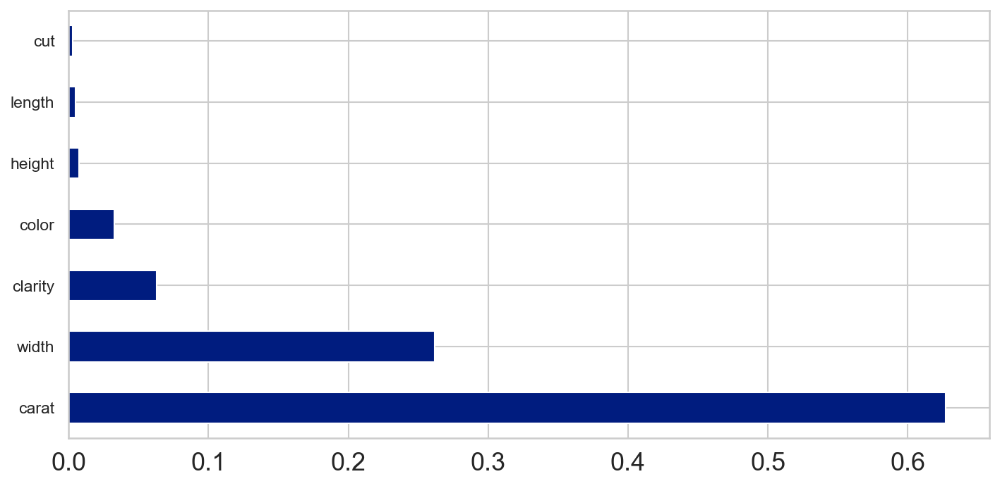

In [152]:
plt.figure(figsize=(10,5))
feat_imp = pd.Series(dt.feature_importances_ , index=X.columns)
feat_imp.nlargest(20).plot(kind='barh');

In [153]:
print('-------- Decision Tree -------')
print('Accuracy : %.4f' % dt.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

-------- Decision Tree -------
Accuracy : 0.9679
[0.96590503 0.96443042 0.96352521 0.96247162 0.96430189]

R2     : 0.9138 
Adj_R2 : 0.9137 
MSE    : 1403794.60 
MAE    : 693.15 
RMSE   : 1184.82 


## 7) RandomForest Regression

In [154]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()

In [155]:
rf.fit(x_train , y_train)

RandomForestRegressor()

In [156]:
accuracies = cross_val_score(estimator = rf, X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   59.6s finished


array([0.97989473, 0.98106942, 0.98059988, 0.98034935, 0.98112119])

In [157]:
y_pred = rf.predict(x_test)
y_pred

array([2037.8 ,  999.35, 9007.73, ..., 6592.77, 8278.85, 8489.62])

In [158]:
rf.feature_importances_

array([0.00251566, 0.03177306, 0.06349954, 0.62338462, 0.00632772,
       0.26499559, 0.00750381])

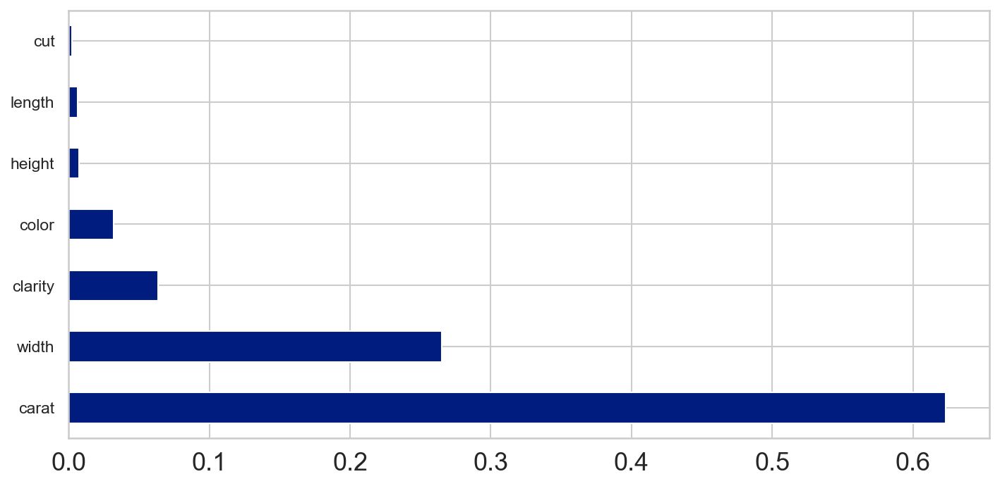

In [159]:
plt.figure(figsize=(10,5))
feat_imp = pd.Series(rf.feature_importances_ , index=X.columns)
feat_imp.nlargest(20).plot(kind='barh');

In [160]:
print('-------- Random Forest -------')
print('Accuracy : %.4f' % rf.score(x_test, y_test))
print(accuracies)

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)

R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

-------- Random Forest -------
Accuracy : 0.9822
[0.97989473 0.98106942 0.98059988 0.98034935 0.98112119]

R2     : 0.9822 
Adj_R2 : 0.9822 
MSE    : 289388.42 
MAE    : 271.58 
RMSE   : 537.95 


### Tuning Parameters

In [180]:
no_of_test=[100]
params_dict={'n_estimators': no_of_test , 'n_jobs':[-1], 'max_features':["auto",'sqrt','log2'] , 
            'max_depth' : [10, 50, 100] , 'min_samples_leaf' : [2, 5, 10] }

b_rf=GridSearchCV(estimator=RandomForestRegressor(), param_grid=params_dict, scoring='r2')

In [181]:
b_rf.fit(x_train,y_train)

GridSearchCV(estimator=RandomForestRegressor(),
             param_grid={'max_depth': [10, 50, 100],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [2, 5, 10], 'n_estimators': [100],
                         'n_jobs': [-1]},
             scoring='r2')

In [182]:
b_rf.best_params_

{'max_depth': 50,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'n_estimators': 100,
 'n_jobs': -1}

# Best parameter

In [161]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(max_depth= 50 ,
                           max_features= 'auto',
                           min_samples_leaf= 2,
                           n_estimators= 100,
                           n_jobs= -1)

In [162]:
rf.fit(x_train,y_train)

RandomForestRegressor(max_depth=50, min_samples_leaf=2, n_jobs=-1)

In [163]:
pred=rf.predict(x_test) 
pred

array([2052.13134524, 1018.79880952, 8984.67199206, ..., 6620.42086111,
       8498.51611111, 8550.80216667])

In [164]:
rf.feature_importances_

array([0.00221502, 0.03171283, 0.06413273, 0.62453372, 0.00600752,
       0.26486381, 0.00653438])

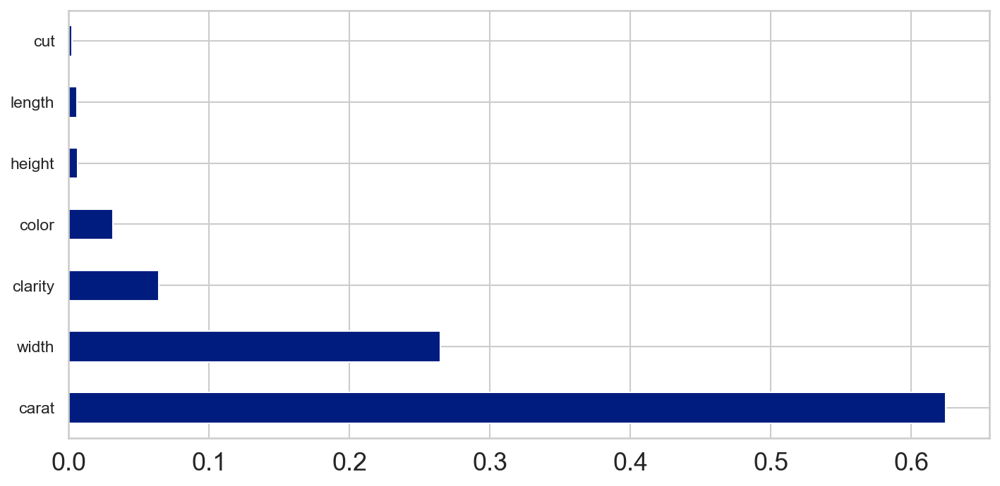

In [165]:
plt.figure(figsize=(10,5))
feat_imp = pd.Series(rf.feature_importances_ , index=X.columns)
feat_imp.nlargest(20).plot(kind='barh');

In [166]:
print('--------Tune Random Forest -------')
print('Accuracy : %.4f' % rf.score(x_test, y_test))

mse  = mean_squared_error(y_test, y_pred)
mae  = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2   = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

--------Tune Random Forest -------
Accuracy : 0.9824

R2     : 0.9822 
Adj_R2 : 0.9822 
MSE    : 289388.42 
MAE    : 271.58 
RMSE   : 537.95 


In [167]:
pred_actual_test = pd.DataFrame ({"pred_test" : y_pred , "Actual_test" : y_test})
pred_actual_test.head(5)

,pred_test,Actual_test
51907,2037.80,2435
38439,999.35,1027
17594,9007.73,7084
30176,667.62,721
44681,1551.15,1610


<AxesSubplot:xlabel='Actual_test', ylabel='pred_test'>

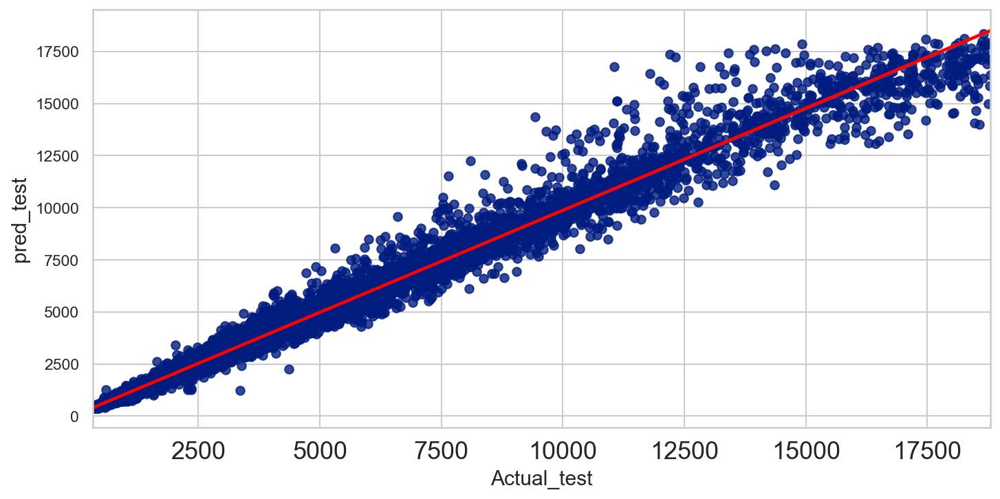

In [168]:
plt.figure(figsize=(10,5))
sns.regplot(pred_actual_test.Actual_test , pred_actual_test.pred_test , line_kws={"color": "red"})

# Train data

In [169]:
print('-------- Random Forest on Train dataset -------')
print('Accuracy : %.4f' % rf.score(x_train, y_train))
pred_train=rf.predict(x_train) 

mse  = mean_squared_error(y_train, pred_train)
mae  = mean_absolute_error(y_train, pred_train)
rmse = mean_squared_error(y_train, pred_train)**0.5
r2   = r2_score(y_train, pred_train)
adj_r2 = 1 - (1-r2)*(len(y_train)-1)/(len(y_train)-x_train.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)



-------- Random Forest on Train dataset -------
Accuracy : 0.9948

R2     : 0.9948 
Adj_R2 : 0.9948 
MSE    : 82227.76 
MAE    : 138.52 
RMSE   : 286.75 


In [170]:
pred_actual_train = pd.DataFrame ({"pred_train" : pred_train , "Actual_train" : y_train})
pred_actual_train.head(5)

,pred_train,Actual_train
19629,7980.810071,8246
43756,1391.892143,1439
2109,3132.159778,3118
44466,1507.699143,1593
12025,4732.876548,5152


<AxesSubplot:xlabel='Actual_train', ylabel='pred_train'>

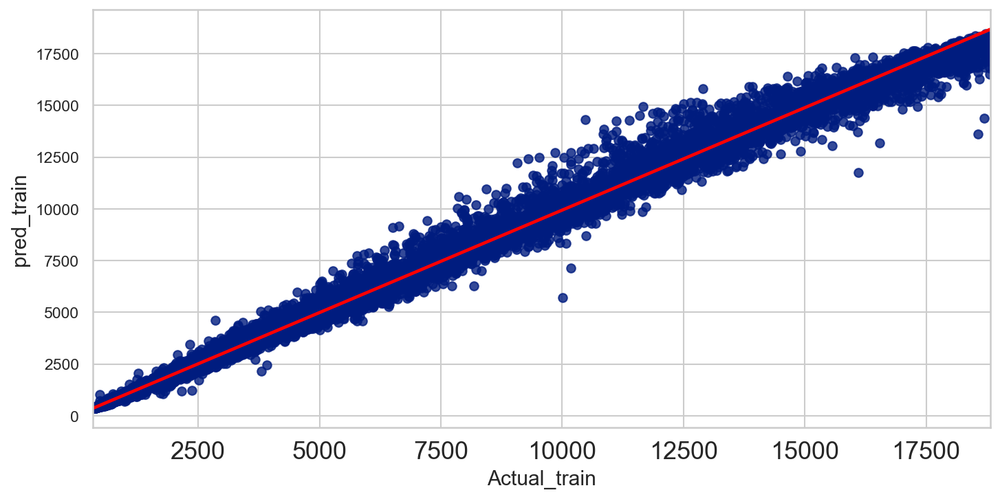

In [171]:
plt.figure(figsize=(10,5))
sns.regplot(pred_actual_train.Actual_train , pred_actual_train.pred_train , line_kws={"color": "red"})

In [172]:
error_train = y_train - pred_train          ## ERROR = Actual value - Predicted value
error_test = y_test- y_pred

In [173]:
error_train.mean()

-0.5828667923091548

In [174]:
error_test.mean()

0.7062184431079469

<AxesSubplot:xlabel='price', ylabel='Density'>

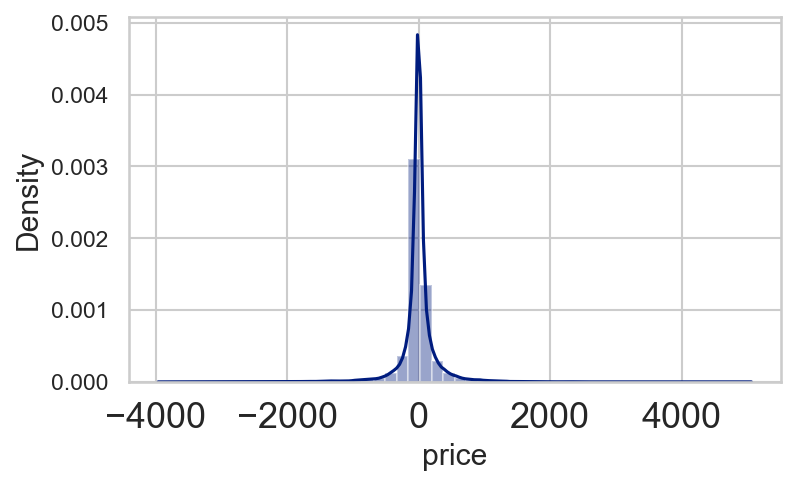

In [175]:
plt.figure(figsize=(5,3))
sns.distplot(error_train)

<AxesSubplot:xlabel='price', ylabel='Density'>

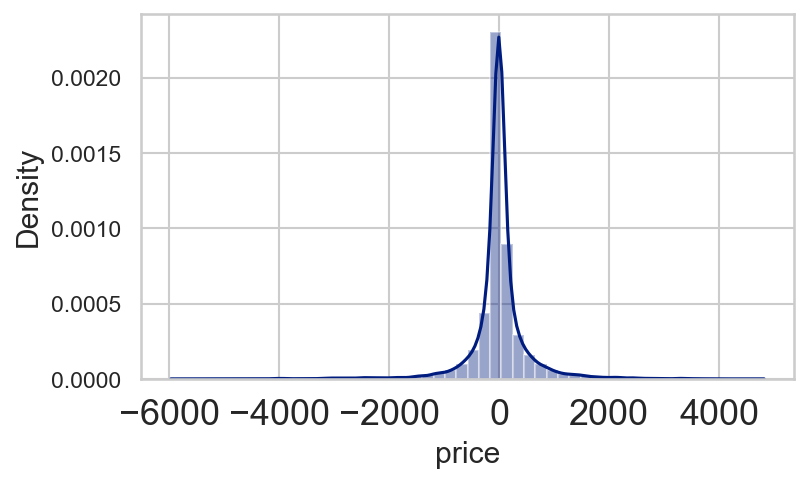

In [176]:
plt.figure(figsize=(5,3))
sns.distplot(error_test)

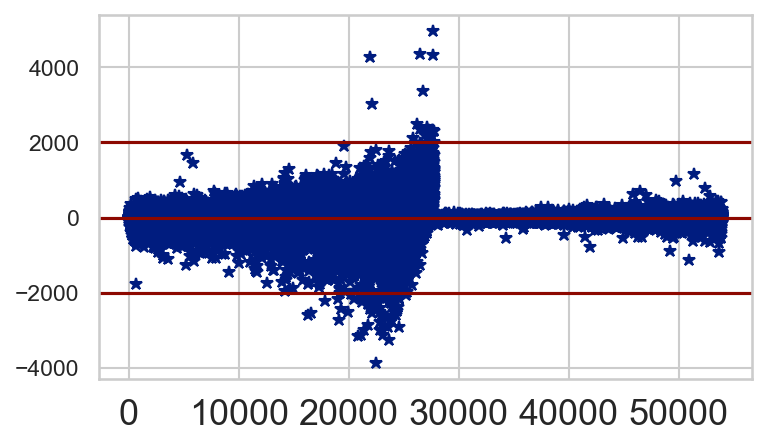

In [177]:
plt.figure(figsize=(5,3))
plt.plot(error_train , "*")                                
plt.axhline(y = error_train.mean() , color = "r")
plt.axhline ( y = 2000 , color = "r")
plt.axhline ( y = -2000 , color = "r")

## here we see that our data is equally distributed

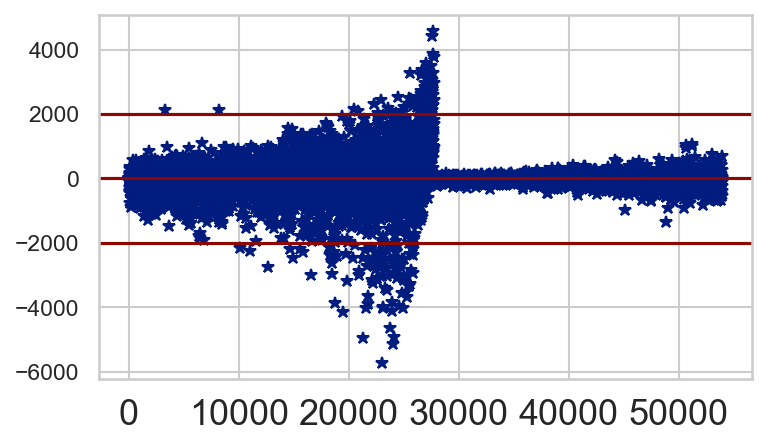

In [178]:
plt.figure(figsize=(5,3))
plt.plot(error_test , "*")                                
plt.axhline(y = error_train.mean() , color = "r")
plt.axhline ( y = 2000 , color = "r")
plt.axhline ( y = -2000 , color = "r")

## here we see that our data is equally distributed

## 8) KNeighbours Regression

In [179]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()

In [180]:
knn.fit(x_train , y_train)

KNeighborsRegressor()

In [181]:
accuracies = cross_val_score(estimator = knn, X = x_train, y = y_train, cv = 5,verbose = 1)
accuracies

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.2s finished


array([0.97662685, 0.9768793 , 0.9757492 , 0.9738636 , 0.97385664])

In [182]:
y_pred = knn.predict(x_test)
y_pred

array([2068. , 1115.8, 9169.6, ..., 6647. , 8698.2, 9235.6])

In [183]:
print('------- KNeighbours Regression -------')
print('Accuracy : %.4f' % knn.score(x_test, y_test))
print(accuracies)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

------- KNeighbours Regression -------
Accuracy : 0.9782
[0.97662685 0.9768793  0.9757492  0.9738636  0.97385664]

R2     : 0.9782 
Adj_R2 : 0.9782 
MSE    : 354277.82 
MAE    : 304.58 
RMSE   : 595.21 


### Tuning Parameters

In [194]:
n_neighbors=[]

for i in range (0,50):
    if(i!=0):
        n_neighbors.append(i)
        
params_dict={'n_neighbors':n_neighbors, 'n_jobs':[-1]}

b_knn=GridSearchCV(estimator=KNeighborsRegressor(), param_grid=params_dict, scoring='r2')

In [195]:
b_knn.fit(x_train,y_train)

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_jobs': [-1],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...]},
             scoring='r2')

In [196]:
b_knn.best_params_

{'n_jobs': -1, 'n_neighbors': 9}

# Best parameter

In [184]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_jobs = -1, n_neighbors = 9)

In [185]:
knn.fit(x_train , y_train)

KNeighborsRegressor(n_jobs=-1, n_neighbors=9)

In [186]:
pred=knn.predict(x_test)
pred

array([2159.        , 1095.77777778, 8692.11111111, ..., 6453.44444444,
       8808.88888889, 9455.        ])

In [187]:
print('-------Tune KNeighbours Regression -------')
print('Accuracy : %.4f' % knn.score(x_test, y_test))

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)**0.5
r2 = r2_score(y_test, y_pred)
adj_r2 = 1 - (1-r2)*(len(y_test)-1)/(len(y_test)-x_test.shape[1]-1)

print('')
print('R2     : %0.4f ' % r2)
print('Adj_R2 : %0.4f ' % adj_r2)
print('MSE    : %0.2f ' % mse)
print('MAE    : %0.2f ' % mae)
print('RMSE   : %0.2f ' % rmse)


R2_Scores.append(r2)
MSE.append(mse) 
MAE.append(mae)
RMSE.append(rmse)
Adj_R2.append(adj_r2)

-------Tune KNeighbours Regression -------
Accuracy : 0.9774

R2     : 0.9782 
Adj_R2 : 0.9782 
MSE    : 354277.82 
MAE    : 304.58 
RMSE   : 595.21 


# Visualizing R2-Score of Algorithms

In [188]:
compare = pd.DataFrame({'Algorithms' : models , 
                        'R2_Scores' : R2_Scores , 
                        'Adj_R2'   : Adj_R2 ,
                        'RMSE' : RMSE ,
                        'MSE' : MSE , 
                        'MAE' : MAE  })

compare.sort_values(by='R2_Scores' , ascending=False)
compare

,Algorithms,R2_Scores,Adj_R2,RMSE,MSE,MAE
0,Linear Regression,0.917591,0.917538,1158.273256,1.341597e+06,784.729202
1,Lasso Regression,0.888344,0.888271,1348.236660,1.817742e+06,875.603838
2,Tune Lasso Regression,0.917597,0.917543,1158.235015,1.341508e+06,784.674944
3,Ridge Regression,0.797053,0.796922,1817.671000,3.303928e+06,1163.501004
4,Tune Ridge Regression,0.917591,0.917538,1158.273256,1.341597e+06,784.729202
5,AdaBoost Regression,0.905487,0.905426,1240.422664,1.538648e+06,988.228326
6,GradientBoosting Regression,0.913771,0.913715,1184.818382,1.403795e+06,693.151602
7,Decision Tree,0.913771,0.913715,1184.818382,1.403795e+06,693.151602
8,RandomForest Regression,0.982224,0.982213,537.948347,2.893884e+05,271.581476
9,Tune Random Forest,0.982224,0.982213,537.948347,2.893884e+05,271.581476


<AxesSubplot:xlabel='R2_Scores', ylabel='Algorithms'>

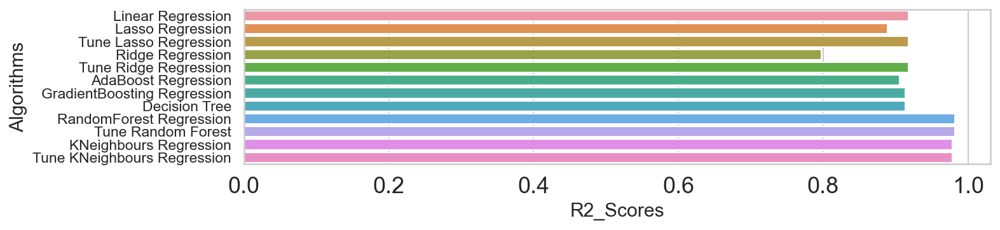

In [190]:
plt.figure(figsize=(9,2))
sns.barplot(x='R2_Scores' , y='Algorithms' , data=compare)

# Random Forest Regressor gives us the highest R2-Score [ 98% ] .



 * **Random forest regressor outperformed all other types of model.**

 * **A random forest regressor model with 7 features is the most robust.**

 * **Carat has the largest effect on price , followed by cut, color, clarity, length , width & height.**
 * **It is recommended businesses or consumers use the random forest regressor model to determine the price of a diamond.**
